# DATA

## What is this notebook about

This notebook builds upon the notebook ``` spacenet6_masking.ipynb ```

``` spacenet6_masking.ipynb ``` is used to generate all the masks for all 3401 training images, using only the PAN images and geojson_buildings files. These masks will be the same regardless of the original data format, hence it is a run-once-and-forget. 


**Batch Size**

This notebook is to be compared against keras_12B, experiment 1D, to find out if changing the batch size to a smaller one will help the models learn better and faster

## Setup COLAB and imports

Mount drive to gain access to files

In [ ]:
''' Used to reference the root directory, for directory traversal ''' 
from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)
mount_dir = '/content/gdrive'
root_dir = '/content/gdrive/My Drive/Colab Notebooks'

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/gdrive


Installations required

In [ ]:
! pip install fiona
! pip install rasterio
! pip install segmentation-models

     |████████████████████████████████| 18.2MB 1.3MB/s 


Imports required

In [ ]:
''' dealing with .tif files '''
import fiona
import rasterio
from rasterio.mask import mask
from rasterio.plot import show, reshape_as_raster, reshape_as_image

''' plotting images '''
from matplotlib import pyplot as plt
%matplotlib inline

''' traversing directories '''
import os
from pathlib import Path

''' core '''
import numpy as np
import pandas as pd

''' utilities '''
from tqdm import tqdm
import copy
import datetime

''' image processing '''
import tensorflow as tf
from tensorflow.keras.preprocessing import image

''' unet model '''
import segmentation_models as sm
from segmentation_models import Unet
from segmentation_models.losses import JaccardLoss, BinaryFocalLoss
from segmentation_models.metrics import IOUScore, FScore

Using TensorFlow backend.


Segmentation Models: using `keras` framework.


## Global

### Constants, IMG
For reference the various image types are as such (amax is a rough gauge) based on the train_all data

```
type             shape                dtype       gauge of max value    gauge of min value
PAN              (1, 900, 900)        uint16      1844                  0
PS-RGB           (3, 900, 900)        uint8       255                   0
PS-RGBNIR        (4, 900, 900)        uint16      2047                  0
RGBNIR           (4, 450, 450)        uint16      2047                  0
SAR-Intensity    (4, 900, 900)        float32     92.87763              0.0
```



In [ ]:
''' get the same sequence for random set every time '''
seed = 42
np.random.seed = seed
tf.seed = seed       

''' lookup - define image channels for each image type '''
IMG_TYPE_LOOKUP = {
    'PAN': {'channels': 1, 'dtype': np.uint16}, 
    'PS-RGB': {'channels': 3, 'dtype': np.uint8}, 
    'PS-RGBNIR': {'channels': 4, 'dtype': np.uint16}, 
    'RGBNIR': {'channels': 4, 'dtype': np.uint16}, 
    'SAR-Intensity': {'channels': 4, 'dtype': np.float32}, 
}

''' image height and width we are working with for the whole notebook '''
IMG_HEIGHT = 256    
IMG_WIDTH = 256

''' root of all paths '''
PATH_SPACENET6 = Path(root_dir + '/spacenet6')
PATH_METRICS = PATH_SPACENET6/'metrics_keras_12.csv'

### SIZE, IDX
We will be setting the amount of data that we want to use for train/test
* There are 3401 images for each image type
* The actual spacenet6 "test folder" has only uneseen SAR-Intensity data

Therefore for training purposes, we will pull out our own "test data" from the training set for ease of verifying output 

Random indexes will be used for training and test

In [ ]:
''' set the various sizes we want to use '''
SIZE_ALL = 3401 
SIZE_TRAIN = 800           # CHANGE HERE
SIZE_TEST = 80            # CHANGE HERE
# 800-80, 1600-160, 3200-201

''' set the various idexes we want to use '''
try:
  TRAIN_IDX = np.load(PATH_SPACENET6/('TRAIN_IDX_'+str(SIZE_TRAIN)+'.npy'))
  TEST_IDX = np.load(PATH_SPACENET6/('TEST_IDX_'+str(SIZE_TEST)+'.npy'))
  print('TRAIN/TEST indexes available. Loading ')
except:
  ''' Generate the indexes that we will be using for train and test '''  
  ALL_IDX = np.arange(SIZE_ALL)

  TRAIN_IDX = np.random.choice(ALL_IDX, SIZE_TRAIN, replace=False)
  TRAIN_IDX.sort()

  ALL_IDX_2 = np.setdiff1d(ALL_IDX, TRAIN_IDX)

  TEST_IDX = np.random.choice(ALL_IDX_2, SIZE_TEST, replace=False)
  TEST_IDX.sort()

  np.save(PATH_SPACENET6/('TRAIN_IDX_'+str(SIZE_TRAIN)), TRAIN_IDX)
  np.save(PATH_SPACENET6/('TEST_IDX_'+str(SIZE_TEST)), TEST_IDX)
  print('TRAIN/TEST indexes not available. Generated and saved ')

### Rotation file
These are the images that have been rotated

In [ ]:
TO_ROTATE = []
PATH_ORIENTATIONS = PATH_SPACENET6/'spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/SummaryData/SAR_orientations.txt'

orientation_file = open(PATH_ORIENTATIONS, "r")
for line in orientation_file:
  tilename = line.split(' ')[0]
  orientation_flag = int(line.split(' ')[1])

  if orientation_flag == 1:
    TO_ROTATE.append(tilename)

TO_ROTATE.sort()

print('orientation file loaded')

## Helper functions

### rotation()

In [ ]:
def rotation(filename, img):
  try:
    if filename.split(IMG_TYPE+'_')[1].split('_tile_')[0] in TO_ROTATE:
      return np.fliplr(np.flipud(img))
    else:
      return img
  except: 
    pass

  try:
    if filename.split('Buildings_')[1].split('_tile_')[0] in TO_ROTATE:
      return np.fliplr(np.flipud(img))
    else:
      return img
  except: 
    pass
      
  
  return img

### plot_XY()

In [ ]:
def plot_XY(plotname, X, Y, X_name, Y_name):
  ix = np.random.randint(0, len(X))
  print("index: {}".format(ix))
  print(plotname, " set")

  fig, (ax1, ax2) = plt.subplots(1,2, figsize=(16,5))
  show(reshape_as_raster(X[ix]), ax=ax1, title=X_name)
  show(reshape_as_raster(Y[ix]), ax=ax2, title=Y_name)
  plt.show()

### plot_XY_preds()

In [ ]:
def plot_XY_preds(plotname, X, Y, P, X_name, Y_name, P_name, index=None):
  if index==None:
    ix = np.random.randint(0, len(X))
  else:
    ix = index
  print("index: {}".format(ix))
  print(plotname, " set")

  fig, (ax1, ax2, ax3) = plt.subplots(1,3, figsize=(16,5))

  if X.dtype == 'float32':
    show(reshape_as_raster(  (X[ix] - np.amin(X)) / (np.amax(X) - np.amin(X))   ), ax=ax1, title=X_name)
  else:
    show(reshape_as_raster(X[ix]), ax=ax1, title=X_name)
  show(reshape_as_raster(Y[ix]), ax=ax2, title=Y_name)
  show(reshape_as_raster(P[ix]), ax=ax3, title=P_name)
  plt.show()

### plot_history()

In [ ]:
def plot_history(history):
  fig, (ax1, ax2, ax3) = plt.subplots(1,3, figsize=(16,5))

  ax1.plot(history['loss'], label='train')
  ax1.plot(history['val_loss'], label='val')
  ax1.title.set_text('loss')
  ax1.legend()

  ax2.plot(history['iou_score'], label='train')
  ax2.plot(history['val_iou_score'], label='val')
  ax2.title.set_text('iou_score')
  ax2.legend()

  ax3.plot(history['f1-score'], label='train')
  ax3.plot(history['val_f1-score'], label='val')
  ax3.title.set_text('f1-score')
  ax3.legend()

### store_metrics()
Save into the metrics file

In [ ]:
try: 
  METRICS_HISTORY = pd.read_csv(PATH_METRICS)
except:
  TIMESTAMP = datetime.datetime.now().strftime("%d/%m/%Y %H:%M:%S")
  IMG_TYPE, IMG_ROTATED, MODEL_NAME, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS = 'trial', 'trial', 'trial', 'trial', 'trial', 'trial', 'trial'
  MODEL_BATCH_SIZE, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST, train_loss, train_iou_score, train_f1_score, val_loss, val_iou_score, val_f1_score, test_loss, test_iou_score, test_f1_score = 0,0,0,0,0,0,0,0,0,0,0,0,0

  METRICS_HISTORY = pd.DataFrame(np.array([[TIMESTAMP, IMG_TYPE, IMG_ROTATED, MODEL_NAME, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_BATCH_SIZE, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST, 
                              test_loss, test_iou_score, test_f1_score,
                              val_loss, val_iou_score, val_f1_score, 
                              train_loss, train_iou_score, train_f1_score
                              ]]),
                    columns=['timestamp', 'img_type', 'img_rotated', 'model_name', 'model_type', 'pretrain', 'loss_function', 'comments', 'batch_size', 'epochs', 'size_train', 'size_test', 
                              'test_loss', 'test_iou_score', 'test_f1-score',
                              'val_loss', 'val_iou_score', 'val_f1-score', 
                              'train_loss', 'train_iou_score', 'train_f1-score'
                              ],
                    )
  METRICS_HISTORY.to_csv(PATH_METRICS, index=False)

In [ ]:
def store_metrics(test_loss, test_iou_score, test_f1_score, val_loss, val_iou_score, val_f1_score, train_loss, train_iou_score, train_f1_score, IMG_TYPE, IMG_ROTATED, MODEL_NAME, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_BATCH_SIZE, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST, PATH_METRICS):
  TIMESTAMP = datetime.datetime.now().strftime("%d/%m/%Y %H:%M:%S")

  ''' create another df that looks just like that and concat with ''' 
  new_metrics = pd.DataFrame(np.array([[TIMESTAMP, IMG_TYPE, IMG_ROTATED, MODEL_NAME, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_BATCH_SIZE, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST,
                             test_loss, test_iou_score, test_f1_score,
                             val_loss, val_iou_score, val_f1_score, 
                             train_loss, train_iou_score, train_f1_score                             
                             ]]),
                   columns=['timestamp', 'img_type', 'img_rotated', 'model_name', 'model_type', 'pretrain', 'loss_function', 'comments', 'batch_size', 'epochs', 'size_train', 'size_test', 
                            'test_loss', 'test_iou_score', 'test_f1-score',
                            'val_loss', 'val_iou_score', 'val_f1-score',
                            'train_loss', 'train_iou_score', 'train_f1-score'                            
                            ],
                  )

  new_metrics.to_csv(PATH_METRICS, mode='a', header=False, index=False)
  print("saved model metrics")

## Generator

### gen_input_image_details()
Set the specifications for the image input into the model

In [ ]:
def gen_input_image_details(IMG_TYPE, IMG_ROTATED, IMG_HEIGHT=IMG_HEIGHT, IMG_WIDTH=IMG_WIDTH, IMG_TYPE_LOOKUP=IMG_TYPE_LOOKUP):
  print('gen_input_image_details()')
  
  IMG_CHANNELS = IMG_TYPE_LOOKUP[IMG_TYPE]['channels']
  IMG_DTYPE_SRC = IMG_TYPE_LOOKUP[IMG_TYPE]['dtype']
  IMG_DTYPE = np.uint8               

  print('IMG_TYPE: {}, IMG_HEIGHT: {}, IMG_WIDTH: {}, IMG_ROTATED: {}, IMG_CHANNELS: {}, IMG_DTYPE_SRC: {}, IMG_DTYPE: {}\n'.format(IMG_TYPE, IMG_HEIGHT, IMG_WIDTH, IMG_ROTATED, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE))

  return (IMG_TYPE, IMG_HEIGHT, IMG_WIDTH, IMG_ROTATED, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE)

### gen_paths()
Setting the paths that we require, which will change based on the image type and image size specified

In [ ]:
def gen_paths(IMG_TYPE, IMG_ROTATED, IMG_HEIGHT=IMG_HEIGHT, IMG_WIDTH=IMG_WIDTH):
  print('gen_paths()')

  ''' set the original data source folder '''
  PATH_SRC = PATH_SPACENET6/'spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam'
  PATH_SRC_IMAGE = PATH_SRC/IMG_TYPE
  PATH_SRC_MASK = PATH_SRC/'_mask'


  ''' change in accordance to the image type and dimensions '''
  COMBI = IMG_TYPE + '_' + str(IMG_HEIGHT) + 'x' + str(IMG_WIDTH)


  ''' set the directories for this combination '''
  if IMG_ROTATED:
    PATH_DATA = PATH_SPACENET6/('spacenet6_data_rotated/' + COMBI)
    PATH_DATA.mkdir(parents=True, exist_ok=True)
  else:
    PATH_DATA = PATH_SPACENET6/('spacenet6_data/' + COMBI)
    PATH_DATA.mkdir(parents=True, exist_ok=True)

  PATH_IMAGE = PATH_DATA/'image'
  PATH_IMAGE.mkdir(parents=True, exist_ok=True)

  PATH_MASK = PATH_DATA/'mask'
  PATH_MASK.mkdir(parents=True, exist_ok=True)

  PATH_SAMPLE = PATH_DATA/'sample'
  PATH_SAMPLE.mkdir(parents=True, exist_ok=True)

  PATH_SAVED_MODELS = PATH_DATA/'saved_models'
  PATH_SAVED_MODELS.mkdir(parents=True, exist_ok=True)

  print('PATH_SRC: {}, \nPATH_SRC_IMAGE: {}, \nPATH_SRC_MASK: {}, \nPATH_DATA: {}, \nPATH_IMAGE: {}, \nPATH_MASK: {}, \nPATH_SAMPLE: {}, \nPATH_SAVED_MODELS: {}\n'.format(PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK, PATH_SAMPLE, PATH_SAVED_MODELS))

  return (PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK, PATH_SAMPLE, PATH_SAVED_MODELS)

### gen_resized_images()
This will check if the required resized images have already been created. If not, it will create it.

In [ ]:
def gen_resized_images(PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_IMAGE, PATH_MASK, IMG_HEIGHT=IMG_HEIGHT, IMG_WIDTH=IMG_WIDTH):
  print('gen_resized_images()')
  
  
  def resize_and_save(img_src_path, img_fname, img_save_path):
    img = rasterio.open(img_src_path/img_fname)

    ''' use the metadata from the original image '''
    transform = img.transform
    meta = img.meta.copy()

    ''' resize the image '''
    resized_img = img.read()
    # print(resized_img.shape, resized_img.dtype, 'amax: {}'.format(np.amax(resized_img)), 'amin: {}'.format(np.amin(resized_img)))
    resized_img = reshape_as_image(resized_img)
    # print(resized_img.shape, resized_img.dtype, 'amax: {}'.format(np.amax(resized_img)), 'amin: {}'.format(np.amin(resized_img)))

    resized_img = tf.image.resize(resized_img, [IMG_HEIGHT, IMG_WIDTH], method='nearest', preserve_aspect_ratio=True, antialias=True)
    resized_img = reshape_as_raster(resized_img)
    # print(resized_img.shape, resized_img.dtype, 'amax: {}'.format(np.amax(resized_img)), 'amin: {}'.format(np.amin(resized_img)))

    resized_img = rotation(img_fname, resized_img)


    ''' update metadata with new size '''
    meta.update({"transform": transform,
                "height": resized_img.shape[1],
                "width": resized_img.shape[2]
                })

    ''' write the resized image to a new geotiff '''
    with rasterio.open(img_save_path/img_fname, 'w', **meta) as dst:
      dst.write(resized_img)




  ''' Verify contents in source directory are present and assign to iterator '''
  src_image_ids = next(os.walk(PATH_SRC_IMAGE))[2]
  src_image_ids.sort()
  # print('len(src_image_ids): {}'.format(len(src_image_ids)))
  # print(src_image_ids[:3])

  src_mask_ids = next(os.walk(PATH_SRC_MASK))[2]
  src_mask_ids.sort()
  # print('len(src_mask_ids): {}'.format(len(src_mask_ids)))
  # print(src_mask_ids[:3])


  ''' check the target directory for existing files '''
  existing_image_ids = next(os.walk(PATH_IMAGE))[2]
  existing_image_ids.sort()
  # print('len(existing_image_ids): {}'.format(len(existing_image_ids)))
  # print(existing_image_ids[:3])

  existing_mask_ids = next(os.walk(PATH_MASK))[2]
  existing_mask_ids.sort()
  # print('len(existing_mask_ids): {}'.format(len(existing_mask_ids)))
  # print(existing_mask_ids[:3])


  ''' check if resized files already exist, else create them '''
  if (existing_image_ids == src_image_ids) and (existing_mask_ids == src_mask_ids): 
    print('Resized images and masks available\n')
    pass
  else:
    print('Resized images and masks not available')
    print('Resizing image')
    for n, id in tqdm(enumerate(src_image_ids), total=len(src_image_ids), position=0, leave=True):
      resize_and_save(PATH_SRC_IMAGE, id, PATH_IMAGE)
    print('Finished resizing image')

    print('Resizing mask')
    for n, id in tqdm(enumerate(src_mask_ids), total=len(src_mask_ids), position=0, leave=True):
      resize_and_save(PATH_SRC_MASK, id, PATH_MASK)
    print('Finished resizing mask')

    print('Resized images and masks generated\n')

### gen_train_test_set()
This will return the train test set 

In [ ]:
def gen_train_test_set(PATH_IMAGE, PATH_MASK, IMG_CHANNELS, IMG_DTYPE_SRC, TRAIN_IDX, TEST_IDX, SIZE_TRAIN=SIZE_TRAIN, SIZE_TEST=SIZE_TEST, IMG_HEIGHT=IMG_HEIGHT, IMG_WIDTH=IMG_WIDTH):
  print('gen_train_test_set()')  
  
  X_train_sample_fname = 'sample_X_train_{}.npy'.format(SIZE_TRAIN)
  Y_train_sample_fname = 'sample_Y_train_{}.npy'.format(SIZE_TRAIN)
  X_test_sample_fname = 'sample_X_test_{}.npy'.format(SIZE_TEST)
  Y_test_sample_fname = 'sample_Y_test_{}.npy'.format(SIZE_TEST)
  
  
  ''' load sample data if present '''
  try:
    X_train = np.load(PATH_SAMPLE/X_train_sample_fname).reshape((SIZE_TRAIN,IMG_HEIGHT,IMG_WIDTH,IMG_CHANNELS))
    Y_train = np.load(PATH_SAMPLE/Y_train_sample_fname).reshape((SIZE_TRAIN,IMG_HEIGHT,IMG_WIDTH,1))
    X_test = np.load(PATH_SAMPLE/X_test_sample_fname).reshape((SIZE_TEST,IMG_HEIGHT,IMG_WIDTH,IMG_CHANNELS))
    Y_test = np.load(PATH_SAMPLE/Y_test_sample_fname).reshape((SIZE_TEST,IMG_HEIGHT,IMG_WIDTH,1))
    print('Sample data available. Loaded sample data\n')

  except:
    ''' get the ids/filenames that we need, based on the random index allocation to avoid grouping '''
    ''' X are image files, Y are mask files '''
    print('Sample data not available')
    all_img_ids = next(os.walk(PATH_IMAGE))[2]
    all_img_ids.sort()
    all_img_ids = np.array(all_img_ids)

    all_mask_ids = next(os.walk(PATH_MASK))[2]
    all_mask_ids.sort()
    all_mask_ids = np.array(all_mask_ids)

    X_train_ids = all_img_ids[TRAIN_IDX]
    X_train_ids.sort()
    Y_train_ids = all_mask_ids[TRAIN_IDX]
    Y_train_ids.sort()

    X_test_ids = all_img_ids[TEST_IDX]
    X_test_ids.sort()
    Y_test_ids = all_mask_ids[TEST_IDX]
    Y_test_ids.sort()

    # print(len(all_img_ids))
    # print(all_img_ids[:3])
    # print(len(all_mask_ids))
    # print(all_mask_ids[:3])
    # print(len(X_train_ids))
    # print(X_train_ids[:3])
    # print(len(Y_train_ids))
    # print(Y_train_ids[:3])
    # print(len(X_test_ids))
    # print(X_test_ids[:3])
    # print(len(Y_test_ids))
    # print(Y_test_ids[:3])


    ''' prepare numpy arrays to store converted image and mask files. Image files will need to be converted to IMG_DTYPE_SRC and mask files will be converted to np.bool '''
    X_train = np.zeros((len(X_train_ids), IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS), dtype=IMG_DTYPE_SRC) 
    Y_train = np.zeros((len(Y_train_ids), IMG_HEIGHT, IMG_WIDTH, 1), dtype=np.bool)
    X_test = np.zeros((len(X_test_ids), IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS), dtype=IMG_DTYPE_SRC) 
    Y_test = np.zeros((len(Y_test_ids), IMG_HEIGHT, IMG_WIDTH, 1), dtype=np.bool)

    # print('X_train', X_train.shape, X_train.dtype)
    # print('Y_train', Y_train.shape, Y_train.dtype)
    # print('X_test', X_test.shape, X_test.dtype)
    # print('Y_test', Y_test.shape, Y_test.dtype)

    ''' actually format the imaegs into the correct data shape and type '''
    print('formatting training images')
    for n, id in tqdm(enumerate(X_train_ids), total=len(X_train_ids), position=0, leave=True):
      img = rasterio.open(PATH_IMAGE/id).read()
      img = reshape_as_image(img)
      X_train[n] = img
    print('Finished formatting training images')

    print('formatting training masks')
    for n, id in tqdm(enumerate(Y_train_ids), total=len(Y_train_ids), position=0, leave=True):
      img = rasterio.open(PATH_MASK/id).read()
      img = reshape_as_image(img)
      img = img.astype(np.bool) 
      Y_train[n] = img
    print('Finished formatting training masks')

    print('formatting test images')
    for n, id in tqdm(enumerate(X_test_ids), total=len(X_test_ids), position=0, leave=True):
      img = rasterio.open(PATH_IMAGE/id).read()
      img = reshape_as_image(img)
      X_test[n] = img
    print('Finished formatting test images')

    print('formatting test masks')
    for n, id in tqdm(enumerate(Y_test_ids), total=len(Y_test_ids), position=0, leave=True):
      img = rasterio.open(PATH_MASK/id).read()
      img = reshape_as_image(img)
      img = img.astype(np.bool) 
      Y_test[n] = img
    print('Finished formatting test masks')  


    np.save(PATH_SAMPLE/X_train_sample_fname, X_train.ravel())
    np.save(PATH_SAMPLE/Y_train_sample_fname, Y_train.ravel())
    np.save(PATH_SAMPLE/X_test_sample_fname, X_test.ravel())
    np.save(PATH_SAMPLE/Y_test_sample_fname, Y_test.ravel())

    print('Sample data generated and saved\n')

  return (X_train, Y_train, X_test, Y_test)

### gen_model()
This will generate a basic model to use 

In [ ]:
def gen_model(MODEL_LOSS, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, IMG_CHANNELS, MODEL_ID=None, MODEL_COMMENTS=''): 
  MODEL_OPTIMIZER = 'adam'
  MODEL_LOSS = JaccardLoss()                                      # CHANGE HERE
  MODEL_METRICS =[IOUScore(), FScore()]
  MODEL_VAL_SPLIT = 0.1
  MODEL_VAL_OFFSET = int(SIZE_TRAIN*(1-MODEL_VAL_SPLIT))    
  MODEL_BATCH_SIZE = MODEL_BATCH_SIZE
  MODEL_EPOCHS = MODEL_EPOCHS                                               # CHANGE HERE

  MODEL_TYPE = 'segmentation-models Unet'
  MODEL_PRETRAIN = MODEL_PRETRAIN                                     # CHANGE HERE
  MODEL_LOSS_FUNCTION = MODEL_LOSS_FUNCTION                           # CHANGE HERE
  MODEL_COMMENTS = MODEL_COMMENTS

  if MODEL_ID == None:
    MODEL_NAME = 'MODEL_{}__PRETRAIN_{}__LOSS_{}__EPOCH_{}__TRAIN_{}__TEST_{}'.format(MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST)
  else:
    MODEL_NAME = 'ID_{}__MODEL_{}__PRETRAIN_{}__LOSS_{}__EPOCH_{}__TRAIN_{}__TEST_{}'.format(MODEL_ID, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST)

  model = Unet(backbone_name=MODEL_PRETRAIN, encoder_weights=None, input_shape=(None, None, IMG_CHANNELS))
  model.compile(optimizer=MODEL_OPTIMIZER, loss=MODEL_LOSS, metrics=MODEL_METRICS)

  return (MODEL_OPTIMIZER, MODEL_LOSS, MODEL_METRICS, MODEL_VAL_SPLIT, MODEL_VAL_OFFSET, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_ID, MODEL_NAME, model)


### gen_model_results()
This will generate a basic model to use 

In [ ]:
def gen_model_results(PATH_SAVED_MODELS, MODEL_NAME, X_train, Y_train, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_VAL_SPLIT, load_weights_filename='', load_weights_epochs=0, save_model=False):
  checkpointer = tf.keras.callbacks.ModelCheckpoint( PATH_SAVED_MODELS/(MODEL_NAME+'_WEIGHTS.h5'), verbose=1, save_best_only=True)
  callbacks = [tf.keras.callbacks.EarlyStopping(patience=10, monitor='val_loss', mode='min')]   

  if load_weights_filename == '':
    print('No weights loaded. Training new model')
    results = model.fit(X_train, Y_train, batch_size=MODEL_BATCH_SIZE, epochs=MODEL_EPOCHS, validation_split=MODEL_VAL_SPLIT, callbacks=callbacks)
  else:
    model.load_weights(str(PATH_SAVED_MODELS/load_weights_filename))

    # load_weights_epochs: the extra epochs to train for, after loading in weights. 
    if load_weights_epochs == 0:
      print('Just loading weights')
      results = None
    else:
      print('Weights loaded, training for extra {} epochs'.format(load_weights_epochs))
      results = model.fit(X_train, Y_train, batch_size=MODEL_BATCH_SIZE, epochs=load_weights_epochs, validation_split=MODEL_VAL_SPLIT, callbacks=callbacks)

  if save_model == True:
    # model.save(str(PATH_SAVED_MODELS/(MODEL_NAME+'.h5')))
    model.save_weights(str(PATH_SAVED_MODELS/(MODEL_NAME+'_WEIGHTS.h5')))
    print('model saved')
  
  return (results, model)

### gen_predictions()
This will generate the predictions based on a trained model

In [ ]:
def gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_NAME, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_BATCH_SIZE, MODEL_EPOCHS, SIZE_TRAIN=SIZE_TRAIN, SIZE_TEST=SIZE_TEST, PATH_METRICS=PATH_METRICS):
  ''' split train, val 90-10. validation_split takes the percentage from the back '''
  preds_train = model.predict(X_train[:MODEL_VAL_OFFSET], verbose=1)
  preds_val = model.predict(X_train[MODEL_VAL_OFFSET:], verbose=1)
  preds_test = model.predict(X_test, verbose=1)

  preds_train_t = (preds_train > 0.5).astype(np.uint8)
  preds_val_t = (preds_val > 0.5).astype(np.uint8)
  preds_test_t = (preds_test > 0.5).astype(np.uint8)


  ''' evaluation of prediction '''
  metric_names = model.metrics_names
  
  print("train set evaluation")
  train_metrics = model.evaluate(X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET])
  for x in range(len(metric_names)):
    print(metric_names[x], ': ', train_metrics[x])

  print("\nvalidation set evaluation")
  val_metrics = model.evaluate(X_train[MODEL_VAL_OFFSET:], X_train[MODEL_VAL_OFFSET:])
  for x in range(len(metric_names)):
    print(metric_names[x], ': ', val_metrics[x])

  print("\ntest set evaluation")
  test_metrics = model.evaluate(X_test, Y_test)
  for x in range(len(metric_names)):
    print(metric_names[x], ': ', test_metrics[x])

  store_metrics(test_metrics[0], test_metrics[1], test_metrics[2], val_metrics[0], val_metrics[1], val_metrics[2], train_metrics[0], train_metrics[1], train_metrics[2], IMG_TYPE, IMG_ROTATED, MODEL_NAME, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_BATCH_SIZE, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST, PATH_METRICS)

  return (preds_train_t, preds_val_t, preds_test_t)

## Bring in the SAR data, both rotated and un-rotated
The geotiff metadata has probably been copied wrongly for now for rotated images

In [ ]:
''' run when changing parameters '''
IMG_TYPE, IMG_WIDTH, IMG_HEIGHT, IMG_ROTATED, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE = gen_input_image_details('SAR-Intensity', False)       # CHANGE HERE

PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK, PATH_SAMPLE, PATH_SAVED_MODELS = gen_paths(IMG_TYPE, IMG_ROTATED)
gen_resized_images(PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_IMAGE, PATH_MASK)
X_train_no_rotate, Y_train_no_rotate, X_test_no_rotate, Y_test_no_rotate = gen_train_test_set(PATH_IMAGE, PATH_MASK, IMG_CHANNELS, IMG_DTYPE_SRC, TRAIN_IDX, TEST_IDX)

gen_input_image_details()
IMG_TYPE: SAR-Intensity, IMG_HEIGHT: 256, IMG_WIDTH: 256, IMG_ROTATED: False, IMG_CHANNELS: 4, IMG_DTYPE_SRC: <class 'numpy.float32'>, IMG_DTYPE: <class 'numpy.uint8'>

gen_paths()
PATH_SRC: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam, 
PATH_SRC_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/SAR-Intensity, 
PATH_SRC_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/_mask, 
PATH_DATA: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256, 
PATH_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/image, 
PATH_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/mask, 
PATH_SAMPLE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/sample, 
P

In [ ]:
''' run when changing parameters '''
IMG_TYPE, IMG_WIDTH, IMG_HEIGHT, IMG_ROTATED, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE = gen_input_image_details('SAR-Intensity', True)       # CHANGE HERE

PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK, PATH_SAMPLE, PATH_SAVED_MODELS = gen_paths(IMG_TYPE, IMG_ROTATED)
gen_resized_images(PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_IMAGE, PATH_MASK)
X_train_rotate, Y_train_rotate, X_test_rotate, Y_test_rotate = gen_train_test_set(PATH_IMAGE, PATH_MASK, IMG_CHANNELS, IMG_DTYPE_SRC, TRAIN_IDX, TEST_IDX)

gen_input_image_details()
IMG_TYPE: SAR-Intensity, IMG_HEIGHT: 256, IMG_WIDTH: 256, IMG_ROTATED: True, IMG_CHANNELS: 4, IMG_DTYPE_SRC: <class 'numpy.float32'>, IMG_DTYPE: <class 'numpy.uint8'>

gen_paths()
PATH_SRC: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam, 
PATH_SRC_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/SAR-Intensity, 
PATH_SRC_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/_mask, 
PATH_DATA: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_rotated/SAR-Intensity_256x256, 
PATH_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_rotated/SAR-Intensity_256x256/image, 
PATH_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_rotated/SAR-Intensity_256x256/mask, 
PATH_SAMPLE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_rotated/S

Boolean masks to float32 masks
Package updates as of 4 Aug 2020 rejected the boolean masks, so convert them into np.float32 to match with the X data

In [ ]:
Y_train_rotate = Y_train_rotate.astype(np.float32)
Y_test_rotate = Y_test_rotate.astype(np.float32)
Y_train_no_rotate = Y_train_no_rotate.astype(np.float32)
Y_test_no_rotate = Y_test_no_rotate.astype(np.float32)

In [ ]:
print(X_train_no_rotate.shape, Y_train_no_rotate.shape, X_test_no_rotate.shape, Y_test_no_rotate.shape)
print(X_train_rotate.shape, Y_train_rotate.shape, X_test_rotate.shape, Y_test_rotate.shape)

(800, 256, 256, 4) (800, 256, 256, 1) (80, 256, 256, 4) (80, 256, 256, 1)
(800, 256, 256, 4) (800, 256, 256, 1) (80, 256, 256, 4) (80, 256, 256, 1)


# EXPERIMENT

**There are lots of things that we can experiment with right now**
* float32 vs uint8
* float32 vs float32 normalized to 0,1
* rotation vs no rotation
* early stopping: mode=max, val_iou_score
* various backbones
  *  resnet18 / 34 / 50 / 101 / 152
  *  seresnet18 / 34 / 50 / 101 / 152
  *  seresnext50 / 101 / 154 / 50 / 101
  *  vgg16 / 19
  *  densenet121 / 169 / 201
  *  inceptionresnetv2 / 3
  *  mobilenet / v2
  *  efficientnetb0 / 1 / 2 / 3 / 4 / 5 / 6 / 7
*various loss functions 
  *  jaccardloss
  *  diceloss (play with beta)
  *  binaryceloss
  *  binaryfocalloss (play with alpha, gamma)
    

**focal loss**

α and γ are hyperparameters that can be tweaked for further calibration. γ can also be said as a relaxation parameter in laymen’s terms.
More the value of γ, more importance will be given to misclassified examples and very less loss will be propagated from easy examples. According to the study mentioned in [5], γ=2 gives the best results.

α is used to specify the weight of different categories/labels, the size of the array needs to be consistent with the number of classes.


## Experiment details
patience=10, epochs=100, efficientnetb0, JaccardLoss(), size=800-80, SAR not rotated

1G, 1H: batch size 8, 4

## Experiment 1G: batch size 8

### ID 61

In [ ]:
''' set the train/test ''' 
IMG_TYPE, IMG_WIDTH, IMG_HEIGHT, IMG_ROTATED, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE = gen_input_image_details('SAR-Intensity', False)       # CHANGE HERE
PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK, PATH_SAMPLE, PATH_SAVED_MODELS = gen_paths(IMG_TYPE, IMG_ROTATED)
if IMG_ROTATED:
  X_train, Y_train, X_test, Y_test = X_train_rotate, Y_train_rotate, X_test_rotate, Y_test_rotate
else:
  X_train, Y_train, X_test, Y_test = X_train_no_rotate, Y_train_no_rotate, X_test_no_rotate, Y_test_no_rotate

gen_input_image_details()
IMG_TYPE: SAR-Intensity, IMG_HEIGHT: 256, IMG_WIDTH: 256, IMG_ROTATED: False, IMG_CHANNELS: 4, IMG_DTYPE_SRC: <class 'numpy.float32'>, IMG_DTYPE: <class 'numpy.uint8'>

gen_paths()
PATH_SRC: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam, 
PATH_SRC_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/SAR-Intensity, 
PATH_SRC_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/_mask, 
PATH_DATA: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256, 
PATH_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/image, 
PATH_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/mask, 
PATH_SAMPLE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/sample, 
P

In [ ]:
''' set the model parameters, train model '''
MODEL_OPTIMIZER, MODEL_LOSS, MODEL_METRICS, MODEL_VAL_SPLIT, MODEL_VAL_OFFSET, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_ID, MODEL_NAME, model = gen_model(
    BinaryFocalLoss(alpha=0.5, gamma=1), 8, 100, 'segmentation-models Unet', 'efficientnetb0', 'BinaryFocalLoss(alpha=0.5, gamma=1)', IMG_CHANNELS, MODEL_ID=61, MODEL_COMMENTS='batch size test, early stopping patience 10')          # CHANGE HERE

results, model = gen_model_results(PATH_SAVED_MODELS, MODEL_NAME, X_train, Y_train, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_VAL_SPLIT, 
                                   load_weights_filename='', load_weights_epochs=0, save_model=True)                                            # CHANGE HERE

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


No weights loaded. Training new model
Train on 720 samples, validate on 80 samples
Epoch 1/100
720/720 [==============================] - 81s 113ms/step - loss: 0.8384 - iou_score: 0.1616 - f1-score: 0.2730 - val_loss: 0.9472 - val_iou_score: 0.0528 - val_f1-score: 0.1001
Epoch 2/100
720/720 [==============================] - 52s 72ms/step - loss: 0.7609 - iou_score: 0.2391 - f1-score: 0.3810 - val_loss: 0.9693 - val_iou_score: 0.0307 - val_f1-score: 0.0593
Epoch 3/100
720/720 [==============================] - 52s 72ms/step - loss: 0.7412 - iou_score: 0.2588 - f1-score: 0.4055 - val_loss: 0.9195 - val_iou_score: 0.0805 - val_f1-score: 0.1468
Epoch 4/100
720/720 [==============================] - 52s 72ms/step - loss: 0.7217 - iou_score: 0.2783 - f1-score: 0.4306 - val_loss: 0.8990 - val_iou_score: 0.1010 - val_f1-score: 0.1802
Epoch 5/100
720/720 [==============================] - 52s 72ms/step - loss: 0.7159 - iou_score: 0.2841 - f1-score: 0.4369 - val_loss: 0.6654 - val_iou_score: 0

In [ ]:
''' predict using model '''
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_NAME, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_BATCH_SIZE, MODEL_EPOCHS)

80/80 [==============================] - 1s 15ms/step
train set evaluation
720/720 [==============================] - 10s 14ms/step
loss :  0.5093408743540446
iou_score :  0.4904046654701233
f1-score :  0.6569382548332214

validation set evaluation
80/80 [==============================] - 1s 15ms/step
loss :  0.8818408966064453
iou_score :  0.12597157061100006
f1-score :  0.22242021560668945

test set evaluation
80/80 [==============================] - 1s 14ms/step
loss :  0.6138673782348633
iou_score :  0.3972893953323364
f1-score :  0.5675378441810608
saved model metrics


index: 430
train preds  set


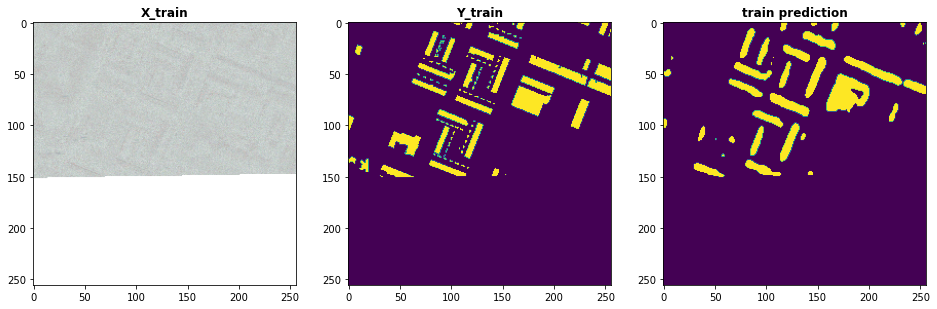

index: 13
val preds  set


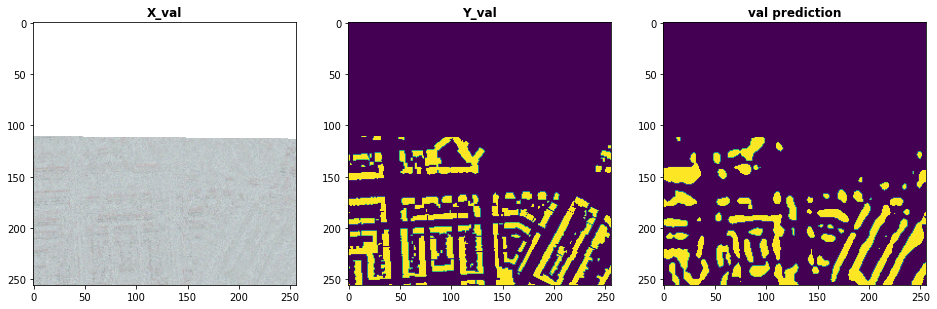

index: 17
test preds  set


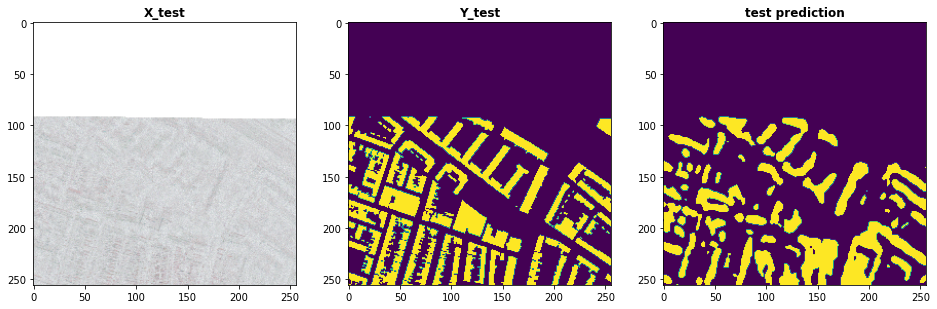

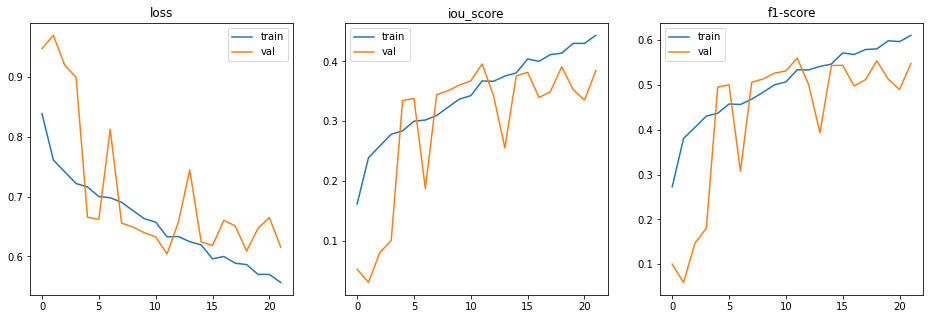

In [ ]:
''' plot predictions to visualize ''' 
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
if results != None:
  plot_history(results.history)

### ID 62

In [ ]:
''' set the train/test ''' 
IMG_TYPE, IMG_WIDTH, IMG_HEIGHT, IMG_ROTATED, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE = gen_input_image_details('SAR-Intensity', False)       # CHANGE HERE
PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK, PATH_SAMPLE, PATH_SAVED_MODELS = gen_paths(IMG_TYPE, IMG_ROTATED)
if IMG_ROTATED:
  X_train, Y_train, X_test, Y_test = X_train_rotate, Y_train_rotate, X_test_rotate, Y_test_rotate
else:
  X_train, Y_train, X_test, Y_test = X_train_no_rotate, Y_train_no_rotate, X_test_no_rotate, Y_test_no_rotate

gen_input_image_details()
IMG_TYPE: SAR-Intensity, IMG_HEIGHT: 256, IMG_WIDTH: 256, IMG_ROTATED: False, IMG_CHANNELS: 4, IMG_DTYPE_SRC: <class 'numpy.float32'>, IMG_DTYPE: <class 'numpy.uint8'>

gen_paths()
PATH_SRC: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam, 
PATH_SRC_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/SAR-Intensity, 
PATH_SRC_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/_mask, 
PATH_DATA: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256, 
PATH_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/image, 
PATH_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/mask, 
PATH_SAMPLE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/sample, 
P

In [ ]:
''' set the model parameters, train model '''
MODEL_OPTIMIZER, MODEL_LOSS, MODEL_METRICS, MODEL_VAL_SPLIT, MODEL_VAL_OFFSET, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_ID, MODEL_NAME, model = gen_model(
    BinaryFocalLoss(alpha=0.5, gamma=1), 8, 100, 'segmentation-models Unet', 'efficientnetb0', 'BinaryFocalLoss(alpha=0.5, gamma=1)', IMG_CHANNELS, MODEL_ID=62, MODEL_COMMENTS='batch size test, early stopping patience 10')          # CHANGE HERE

results, model = gen_model_results(PATH_SAVED_MODELS, MODEL_NAME, X_train, Y_train, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_VAL_SPLIT, 
                                   load_weights_filename='', load_weights_epochs=0, save_model=True)                                            # CHANGE HERE

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


No weights loaded. Training new model
Train on 720 samples, validate on 80 samples
Epoch 1/100
720/720 [==============================] - 73s 102ms/step - loss: 0.8452 - iou_score: 0.1548 - f1-score: 0.2630 - val_loss: 0.8948 - val_iou_score: 0.1052 - val_f1-score: 0.1858
Epoch 2/100
720/720 [==============================] - 52s 72ms/step - loss: 0.7778 - iou_score: 0.2222 - f1-score: 0.3582 - val_loss: 0.9390 - val_iou_score: 0.0610 - val_f1-score: 0.1016
Epoch 3/100
720/720 [==============================] - 52s 72ms/step - loss: 0.7546 - iou_score: 0.2454 - f1-score: 0.3896 - val_loss: 0.7442 - val_iou_score: 0.2558 - val_f1-score: 0.3998
Epoch 4/100
720/720 [==============================] - 52s 72ms/step - loss: 0.7519 - iou_score: 0.2481 - f1-score: 0.3929 - val_loss: 0.9050 - val_iou_score: 0.0950 - val_f1-score: 0.1708
Epoch 5/100
720/720 [==============================] - 52s 72ms/step - loss: 0.7478 - iou_score: 0.2522 - f1-score: 0.3982 - val_loss: 0.7396 - val_iou_score: 0

In [ ]:
''' predict using model '''
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_NAME, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_BATCH_SIZE, MODEL_EPOCHS)

80/80 [==============================] - 1s 14ms/step
train set evaluation
720/720 [==============================] - 10s 14ms/step
loss :  0.4839902573161655
iou_score :  0.5159697532653809
f1-score :  0.6799495816230774

validation set evaluation
80/80 [==============================] - 1s 15ms/step
loss :  0.8708362579345703
iou_score :  0.13818751275539398
f1-score :  0.24116593599319458

test set evaluation
80/80 [==============================] - 1s 14ms/step
loss :  0.6175656080245971
iou_score :  0.39281582832336426
f1-score :  0.5630430579185486
saved model metrics


index: 21
train preds  set


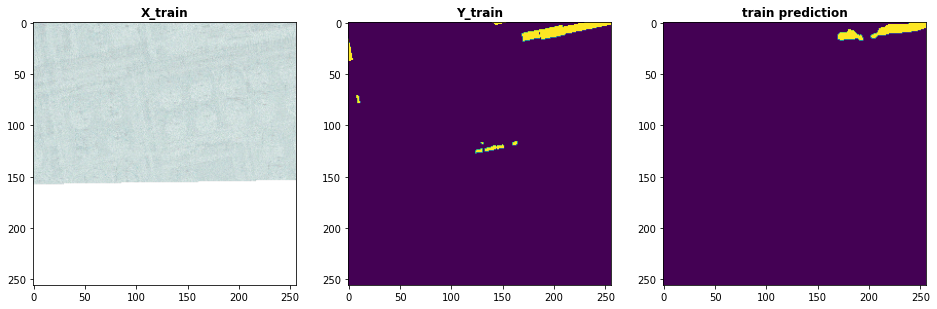

index: 5
val preds  set


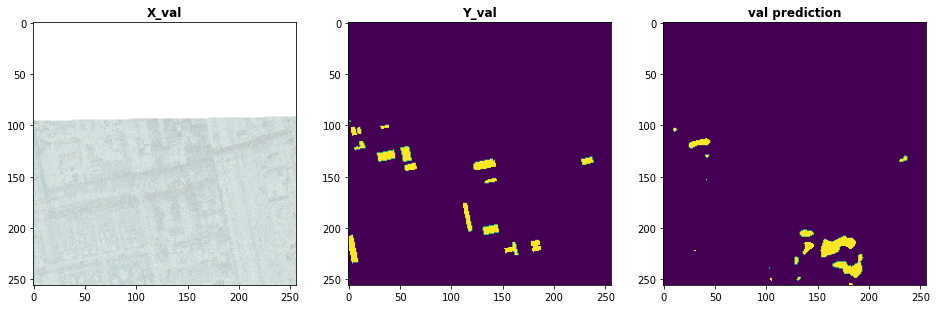

index: 66
test preds  set


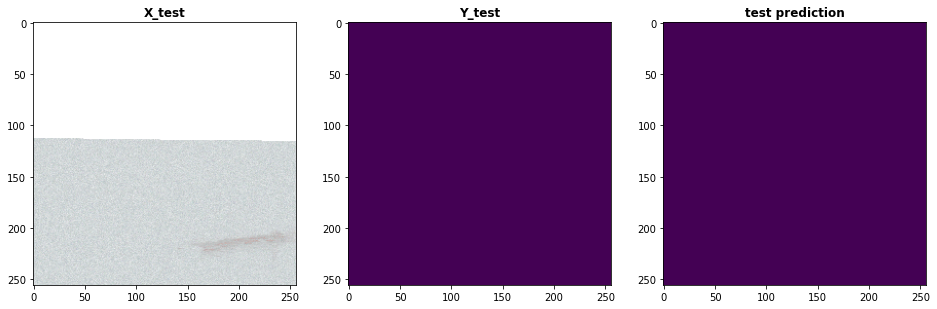

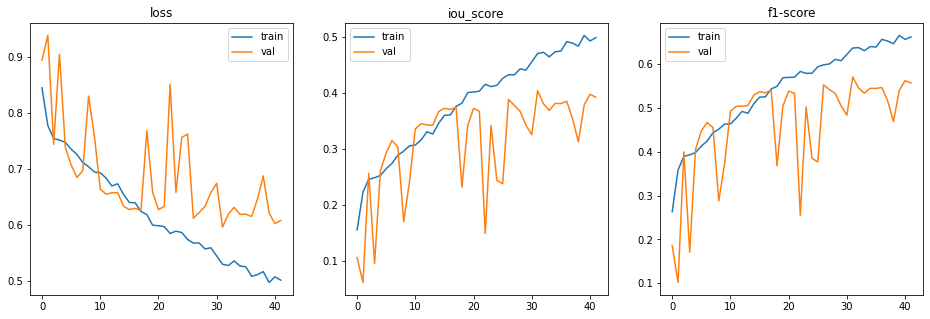

In [ ]:
''' plot predictions to visualize ''' 
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
if results != None:
  plot_history(results.history)

### ID 63

In [ ]:
''' set the train/test ''' 
IMG_TYPE, IMG_WIDTH, IMG_HEIGHT, IMG_ROTATED, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE = gen_input_image_details('SAR-Intensity', False)       # CHANGE HERE
PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK, PATH_SAMPLE, PATH_SAVED_MODELS = gen_paths(IMG_TYPE, IMG_ROTATED)
if IMG_ROTATED:
  X_train, Y_train, X_test, Y_test = X_train_rotate, Y_train_rotate, X_test_rotate, Y_test_rotate
else:
  X_train, Y_train, X_test, Y_test = X_train_no_rotate, Y_train_no_rotate, X_test_no_rotate, Y_test_no_rotate

gen_input_image_details()
IMG_TYPE: SAR-Intensity, IMG_HEIGHT: 256, IMG_WIDTH: 256, IMG_ROTATED: False, IMG_CHANNELS: 4, IMG_DTYPE_SRC: <class 'numpy.float32'>, IMG_DTYPE: <class 'numpy.uint8'>

gen_paths()
PATH_SRC: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam, 
PATH_SRC_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/SAR-Intensity, 
PATH_SRC_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/_mask, 
PATH_DATA: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256, 
PATH_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/image, 
PATH_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/mask, 
PATH_SAMPLE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/sample, 
P

In [ ]:
''' set the model parameters, train model '''
MODEL_OPTIMIZER, MODEL_LOSS, MODEL_METRICS, MODEL_VAL_SPLIT, MODEL_VAL_OFFSET, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_ID, MODEL_NAME, model = gen_model(
    BinaryFocalLoss(alpha=0.5, gamma=1), 8, 100, 'segmentation-models Unet', 'efficientnetb0', 'BinaryFocalLoss(alpha=0.5, gamma=1)', IMG_CHANNELS, MODEL_ID=63, MODEL_COMMENTS='batch size test, early stopping patience 10')          # CHANGE HERE

results, model = gen_model_results(PATH_SAVED_MODELS, MODEL_NAME, X_train, Y_train, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_VAL_SPLIT, 
                                   load_weights_filename='', load_weights_epochs=0, save_model=True)                                            # CHANGE HERE

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


No weights loaded. Training new model
Train on 720 samples, validate on 80 samples
Epoch 1/100
720/720 [==============================] - 74s 103ms/step - loss: 0.8316 - iou_score: 0.1684 - f1-score: 0.2820 - val_loss: 0.9648 - val_iou_score: 0.0352 - val_f1-score: 0.0680
Epoch 2/100
720/720 [==============================] - 52s 72ms/step - loss: 0.7693 - iou_score: 0.2307 - f1-score: 0.3700 - val_loss: 0.8405 - val_iou_score: 0.1595 - val_f1-score: 0.2729
Epoch 3/100
720/720 [==============================] - 52s 72ms/step - loss: 0.7376 - iou_score: 0.2624 - f1-score: 0.4111 - val_loss: 0.7523 - val_iou_score: 0.2477 - val_f1-score: 0.3885
Epoch 4/100
720/720 [==============================] - 52s 72ms/step - loss: 0.7263 - iou_score: 0.2737 - f1-score: 0.4239 - val_loss: 0.7365 - val_iou_score: 0.2635 - val_f1-score: 0.4016
Epoch 5/100
720/720 [==============================] - 52s 73ms/step - loss: 0.7149 - iou_score: 0.2851 - f1-score: 0.4386 - val_loss: 0.6871 - val_iou_score: 0

In [ ]:
''' predict using model '''
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_NAME, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_BATCH_SIZE, MODEL_EPOCHS)

80/80 [==============================] - 1s 14ms/step
train set evaluation
720/720 [==============================] - 10s 14ms/step
loss :  0.37482095691892836
iou_score :  0.6255225539207458
f1-score :  0.7688350677490234

validation set evaluation
80/80 [==============================] - 1s 15ms/step
loss :  0.8855004191398621
iou_score :  0.12229926139116287
f1-score :  0.2166542261838913

test set evaluation
80/80 [==============================] - 1s 14ms/step
loss :  0.6019497156143189
iou_score :  0.40671178698539734
f1-score :  0.5775097012519836
saved model metrics


index: 207
train preds  set


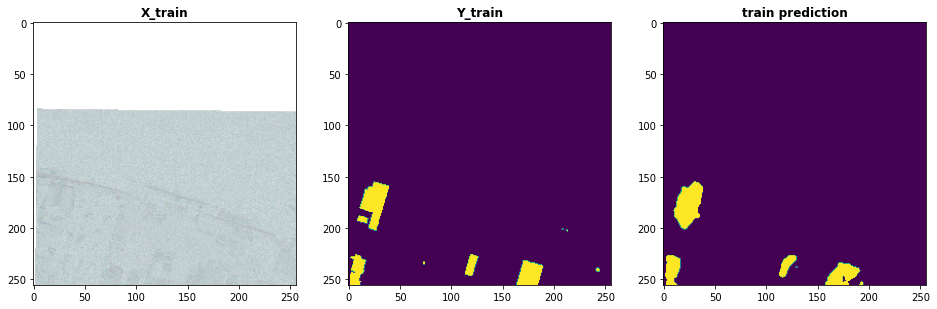

index: 67
val preds  set


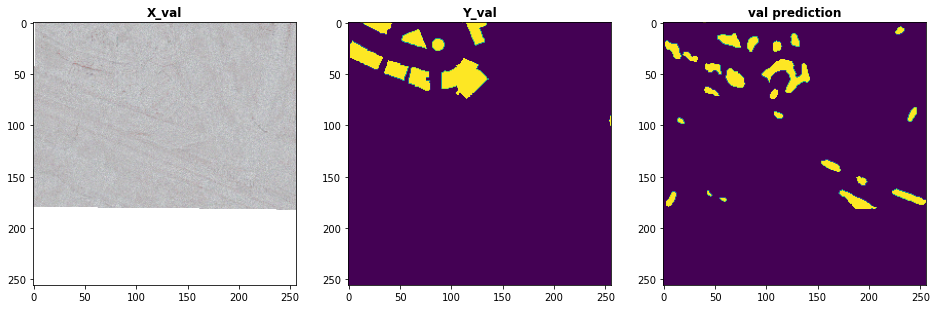

index: 62
test preds  set


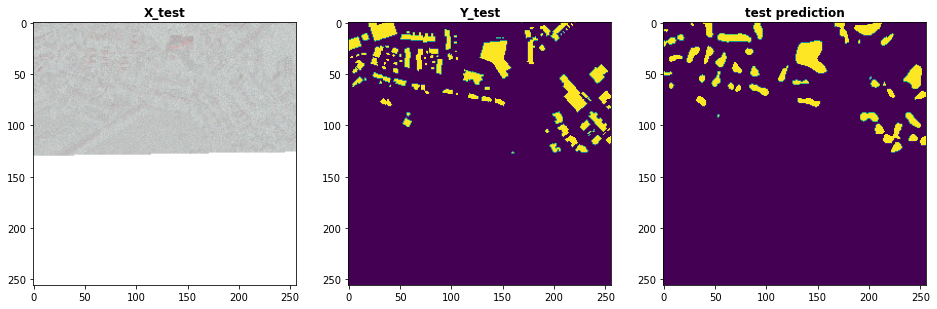

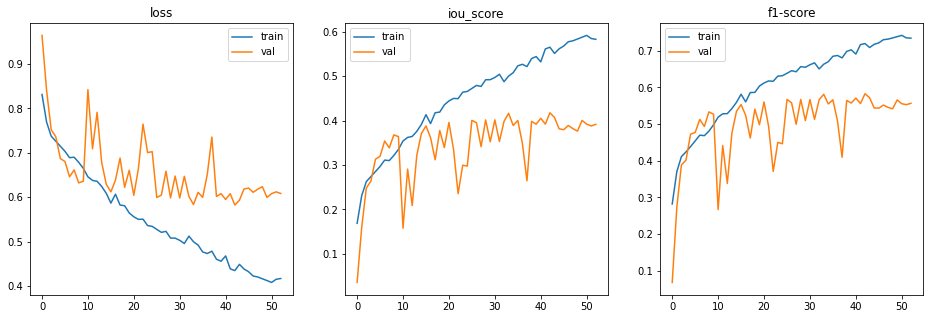

In [ ]:
''' plot predictions to visualize ''' 
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
if results != None:
  plot_history(results.history)

### ID 64

In [ ]:
''' set the train/test ''' 
IMG_TYPE, IMG_WIDTH, IMG_HEIGHT, IMG_ROTATED, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE = gen_input_image_details('SAR-Intensity', False)       # CHANGE HERE
PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK, PATH_SAMPLE, PATH_SAVED_MODELS = gen_paths(IMG_TYPE, IMG_ROTATED)
if IMG_ROTATED:
  X_train, Y_train, X_test, Y_test = X_train_rotate, Y_train_rotate, X_test_rotate, Y_test_rotate
else:
  X_train, Y_train, X_test, Y_test = X_train_no_rotate, Y_train_no_rotate, X_test_no_rotate, Y_test_no_rotate

gen_input_image_details()
IMG_TYPE: SAR-Intensity, IMG_HEIGHT: 256, IMG_WIDTH: 256, IMG_ROTATED: False, IMG_CHANNELS: 4, IMG_DTYPE_SRC: <class 'numpy.float32'>, IMG_DTYPE: <class 'numpy.uint8'>

gen_paths()
PATH_SRC: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam, 
PATH_SRC_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/SAR-Intensity, 
PATH_SRC_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/_mask, 
PATH_DATA: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256, 
PATH_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/image, 
PATH_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/mask, 
PATH_SAMPLE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/sample, 
P

In [ ]:
''' set the model parameters, train model '''
MODEL_OPTIMIZER, MODEL_LOSS, MODEL_METRICS, MODEL_VAL_SPLIT, MODEL_VAL_OFFSET, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_ID, MODEL_NAME, model = gen_model(
    BinaryFocalLoss(alpha=0.5, gamma=1), 8, 100, 'segmentation-models Unet', 'efficientnetb0', 'BinaryFocalLoss(alpha=0.5, gamma=1)', IMG_CHANNELS, MODEL_ID=64, MODEL_COMMENTS='batch size test, early stopping patience 10')          # CHANGE HERE

results, model = gen_model_results(PATH_SAVED_MODELS, MODEL_NAME, X_train, Y_train, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_VAL_SPLIT, 
                                   load_weights_filename='', load_weights_epochs=0, save_model=True)                                            # CHANGE HERE

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


No weights loaded. Training new model
Train on 720 samples, validate on 80 samples
Epoch 1/100
720/720 [==============================] - 74s 102ms/step - loss: 0.8446 - iou_score: 0.1554 - f1-score: 0.2645 - val_loss: 0.8324 - val_iou_score: 0.1676 - val_f1-score: 0.2789
Epoch 2/100
720/720 [==============================] - 52s 72ms/step - loss: 0.7681 - iou_score: 0.2319 - f1-score: 0.3724 - val_loss: 0.9566 - val_iou_score: 0.0434 - val_f1-score: 0.0826
Epoch 3/100
720/720 [==============================] - 52s 72ms/step - loss: 0.7435 - iou_score: 0.2565 - f1-score: 0.4034 - val_loss: 0.7371 - val_iou_score: 0.2629 - val_f1-score: 0.4111
Epoch 4/100
720/720 [==============================] - 52s 72ms/step - loss: 0.7326 - iou_score: 0.2674 - f1-score: 0.4173 - val_loss: 0.8104 - val_iou_score: 0.1896 - val_f1-score: 0.3077
Epoch 5/100
720/720 [==============================] - 52s 72ms/step - loss: 0.7134 - iou_score: 0.2866 - f1-score: 0.4415 - val_loss: 0.7379 - val_iou_score: 0

In [ ]:
''' predict using model '''
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_NAME, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_BATCH_SIZE, MODEL_EPOCHS)

80/80 [==============================] - 1s 14ms/step
train set evaluation
720/720 [==============================] - 10s 14ms/step
loss :  0.4814315093888177
iou_score :  0.5182660818099976
f1-score :  0.6812967658042908

validation set evaluation
80/80 [==============================] - 1s 15ms/step
loss :  0.8887540698051453
iou_score :  0.12191968411207199
f1-score :  0.2151762992143631

test set evaluation
80/80 [==============================] - 1s 14ms/step
loss :  0.6167692065238952
iou_score :  0.3925619125366211
f1-score :  0.5629003643989563
saved model metrics


index: 404
train preds  set


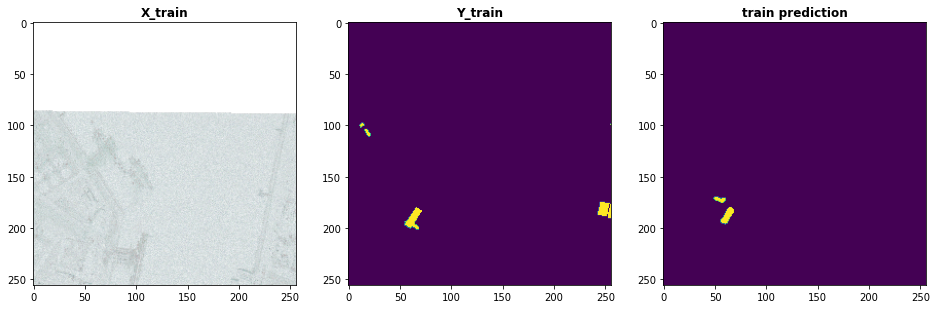

index: 19
val preds  set


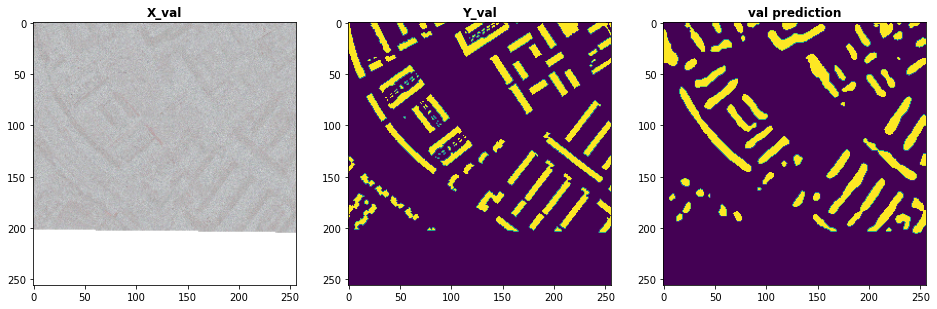

index: 53
test preds  set


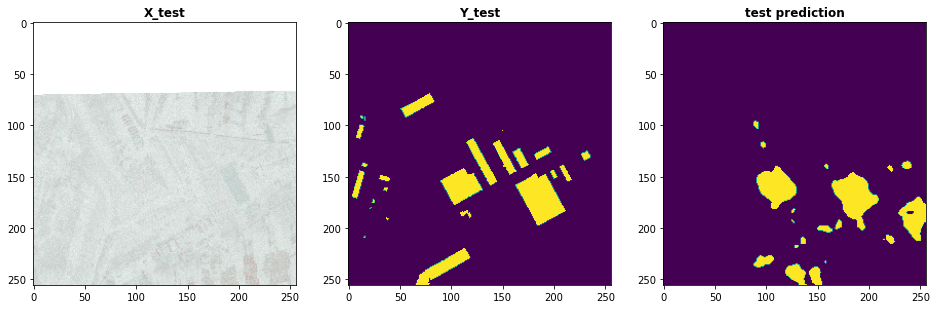

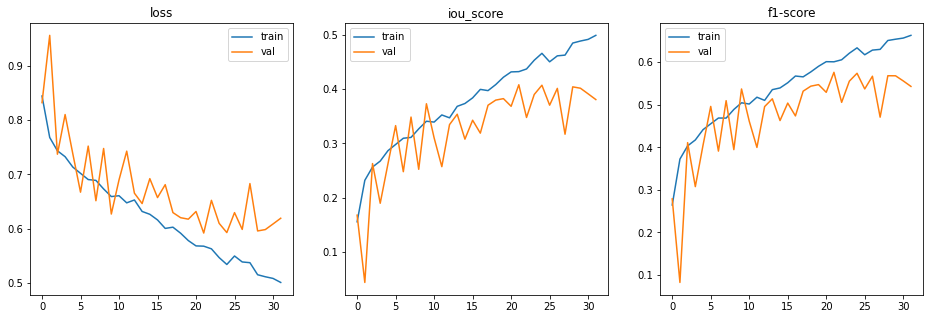

In [ ]:
''' plot predictions to visualize ''' 
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
if results != None:
  plot_history(results.history)

### ID 65

In [ ]:
''' set the train/test ''' 
IMG_TYPE, IMG_WIDTH, IMG_HEIGHT, IMG_ROTATED, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE = gen_input_image_details('SAR-Intensity', False)       # CHANGE HERE
PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK, PATH_SAMPLE, PATH_SAVED_MODELS = gen_paths(IMG_TYPE, IMG_ROTATED)
if IMG_ROTATED:
  X_train, Y_train, X_test, Y_test = X_train_rotate, Y_train_rotate, X_test_rotate, Y_test_rotate
else:
  X_train, Y_train, X_test, Y_test = X_train_no_rotate, Y_train_no_rotate, X_test_no_rotate, Y_test_no_rotate

gen_input_image_details()
IMG_TYPE: SAR-Intensity, IMG_HEIGHT: 256, IMG_WIDTH: 256, IMG_ROTATED: False, IMG_CHANNELS: 4, IMG_DTYPE_SRC: <class 'numpy.float32'>, IMG_DTYPE: <class 'numpy.uint8'>

gen_paths()
PATH_SRC: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam, 
PATH_SRC_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/SAR-Intensity, 
PATH_SRC_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/_mask, 
PATH_DATA: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256, 
PATH_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/image, 
PATH_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/mask, 
PATH_SAMPLE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/sample, 
P

In [ ]:
''' set the model parameters, train model '''
MODEL_OPTIMIZER, MODEL_LOSS, MODEL_METRICS, MODEL_VAL_SPLIT, MODEL_VAL_OFFSET, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_ID, MODEL_NAME, model = gen_model(
    BinaryFocalLoss(alpha=0.5, gamma=1), 8, 100, 'segmentation-models Unet', 'efficientnetb0', 'BinaryFocalLoss(alpha=0.5, gamma=1)', IMG_CHANNELS, MODEL_ID=65, MODEL_COMMENTS='batch size test, early stopping patience 10')          # CHANGE HERE

results, model = gen_model_results(PATH_SAVED_MODELS, MODEL_NAME, X_train, Y_train, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_VAL_SPLIT, 
                                   load_weights_filename='', load_weights_epochs=0, save_model=True)                                            # CHANGE HERE

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


No weights loaded. Training new model
Train on 720 samples, validate on 80 samples
Epoch 1/100
720/720 [==============================] - 55s 77ms/step - loss: 0.8641 - iou_score: 0.1359 - f1-score: 0.2342 - val_loss: 0.8345 - val_iou_score: 0.1655 - val_f1-score: 0.2808
Epoch 2/100
720/720 [==============================] - 27s 38ms/step - loss: 0.7807 - iou_score: 0.2193 - f1-score: 0.3546 - val_loss: 0.9672 - val_iou_score: 0.0328 - val_f1-score: 0.0635
Epoch 3/100
720/720 [==============================] - 27s 38ms/step - loss: 0.7542 - iou_score: 0.2458 - f1-score: 0.3892 - val_loss: 0.8961 - val_iou_score: 0.1039 - val_f1-score: 0.1848
Epoch 4/100
720/720 [==============================] - 27s 38ms/step - loss: 0.7369 - iou_score: 0.2631 - f1-score: 0.4117 - val_loss: 0.7579 - val_iou_score: 0.2421 - val_f1-score: 0.3812
Epoch 5/100
720/720 [==============================] - 28s 39ms/step - loss: 0.7249 - iou_score: 0.2751 - f1-score: 0.4260 - val_loss: 0.6923 - val_iou_score: 0.

In [ ]:
''' predict using model '''
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_NAME, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_BATCH_SIZE, MODEL_EPOCHS)

80/80 [==============================] - 1s 8ms/step
train set evaluation
720/720 [==============================] - 5s 8ms/step
loss :  0.46758873462677003
iou_score :  0.5324301719665527
f1-score :  0.6939401030540466

validation set evaluation
80/80 [==============================] - 1s 8ms/step
loss :  0.8954939603805542
iou_score :  0.11083495616912842
f1-score :  0.1986086219549179

test set evaluation
80/80 [==============================] - 1s 7ms/step
loss :  0.6468394994735718
iou_score :  0.36564990878105164
f1-score :  0.5339915156364441
saved model metrics


index: 285
train preds  set


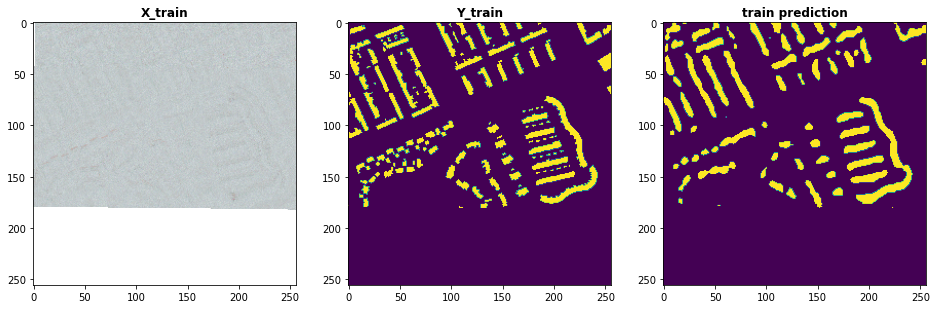

index: 59
val preds  set


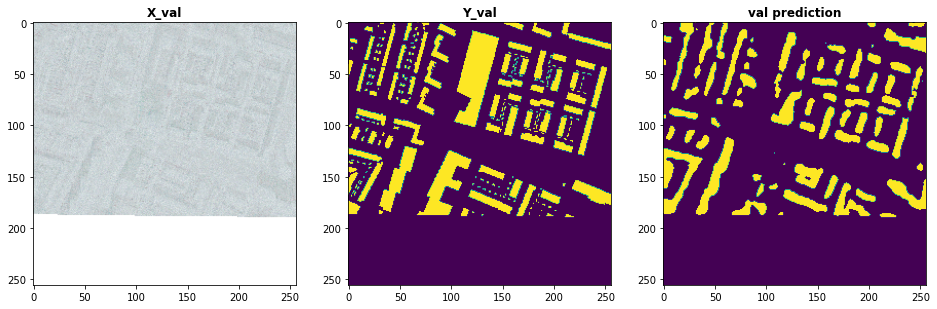

index: 46
test preds  set


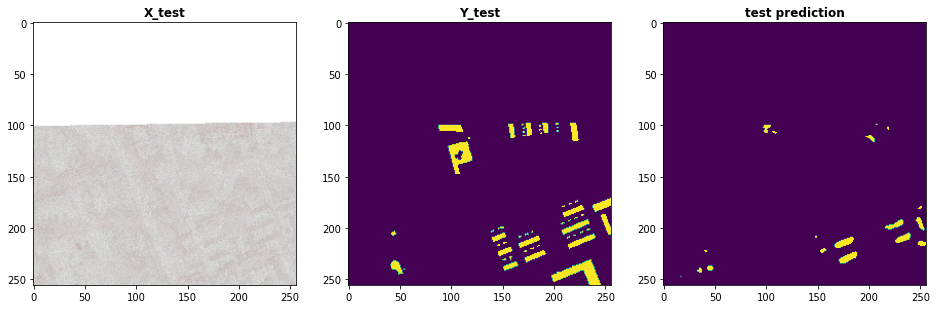

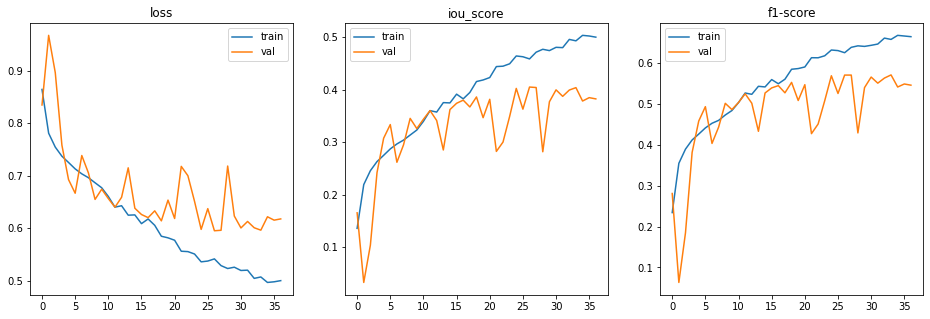

In [ ]:
''' plot predictions to visualize ''' 
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
if results != None:
  plot_history(results.history)

### ID 66

In [ ]:
''' set the train/test ''' 
IMG_TYPE, IMG_WIDTH, IMG_HEIGHT, IMG_ROTATED, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE = gen_input_image_details('SAR-Intensity', False)       # CHANGE HERE
PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK, PATH_SAMPLE, PATH_SAVED_MODELS = gen_paths(IMG_TYPE, IMG_ROTATED)
if IMG_ROTATED:
  X_train, Y_train, X_test, Y_test = X_train_rotate, Y_train_rotate, X_test_rotate, Y_test_rotate
else:
  X_train, Y_train, X_test, Y_test = X_train_no_rotate, Y_train_no_rotate, X_test_no_rotate, Y_test_no_rotate

gen_input_image_details()
IMG_TYPE: SAR-Intensity, IMG_HEIGHT: 256, IMG_WIDTH: 256, IMG_ROTATED: False, IMG_CHANNELS: 4, IMG_DTYPE_SRC: <class 'numpy.float32'>, IMG_DTYPE: <class 'numpy.uint8'>

gen_paths()
PATH_SRC: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam, 
PATH_SRC_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/SAR-Intensity, 
PATH_SRC_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/_mask, 
PATH_DATA: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256, 
PATH_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/image, 
PATH_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/mask, 
PATH_SAMPLE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/sample, 
P

In [ ]:
''' set the model parameters, train model '''
MODEL_OPTIMIZER, MODEL_LOSS, MODEL_METRICS, MODEL_VAL_SPLIT, MODEL_VAL_OFFSET, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_ID, MODEL_NAME, model = gen_model(
    BinaryFocalLoss(alpha=0.5, gamma=1), 8, 100, 'segmentation-models Unet', 'efficientnetb0', 'BinaryFocalLoss(alpha=0.5, gamma=1)', IMG_CHANNELS, MODEL_ID=66, MODEL_COMMENTS='batch size test, early stopping patience 10')          # CHANGE HERE

results, model = gen_model_results(PATH_SAVED_MODELS, MODEL_NAME, X_train, Y_train, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_VAL_SPLIT, 
                                   load_weights_filename='', load_weights_epochs=0, save_model=True)                                            # CHANGE HERE

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


No weights loaded. Training new model
Train on 720 samples, validate on 80 samples
Epoch 1/100
720/720 [==============================] - 49s 68ms/step - loss: 0.8363 - iou_score: 0.1637 - f1-score: 0.2755 - val_loss: 0.8781 - val_iou_score: 0.1219 - val_f1-score: 0.2145
Epoch 2/100
720/720 [==============================] - 28s 39ms/step - loss: 0.7756 - iou_score: 0.2244 - f1-score: 0.3614 - val_loss: 0.9926 - val_iou_score: 0.0074 - val_f1-score: 0.0146
Epoch 3/100
720/720 [==============================] - 28s 39ms/step - loss: 0.7524 - iou_score: 0.2476 - f1-score: 0.3910 - val_loss: 0.7858 - val_iou_score: 0.2142 - val_f1-score: 0.3490
Epoch 4/100
720/720 [==============================] - 28s 39ms/step - loss: 0.7413 - iou_score: 0.2587 - f1-score: 0.4061 - val_loss: 0.8273 - val_iou_score: 0.1727 - val_f1-score: 0.2793
Epoch 5/100
720/720 [==============================] - 28s 39ms/step - loss: 0.7229 - iou_score: 0.2771 - f1-score: 0.4289 - val_loss: 0.7745 - val_iou_score: 0.

In [ ]:
''' predict using model '''
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_NAME, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_BATCH_SIZE, MODEL_EPOCHS)

80/80 [==============================] - 1s 8ms/step
train set evaluation
720/720 [==============================] - 5s 8ms/step
loss :  0.4927551521195306
iou_score :  0.50742506980896
f1-score :  0.6725448369979858

validation set evaluation
80/80 [==============================] - 1s 8ms/step
loss :  0.7889947652816772
iou_score :  0.22813433408737183
f1-score :  0.3672114908695221

test set evaluation
80/80 [==============================] - 1s 8ms/step
loss :  0.5979825973510742
iou_score :  0.4108971059322357
f1-score :  0.5812025666236877
saved model metrics


index: 421
train preds  set


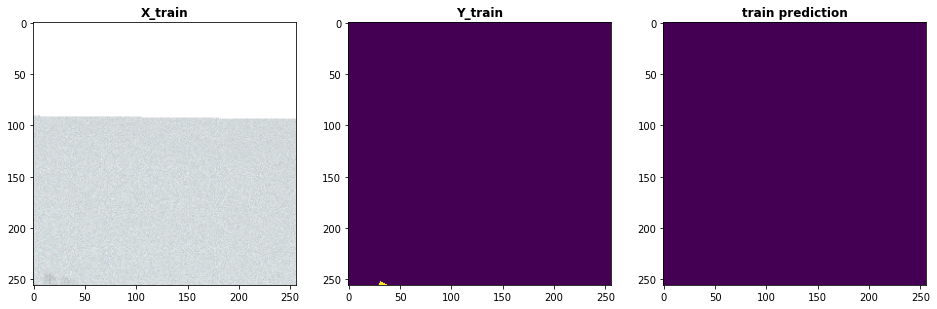

index: 53
val preds  set


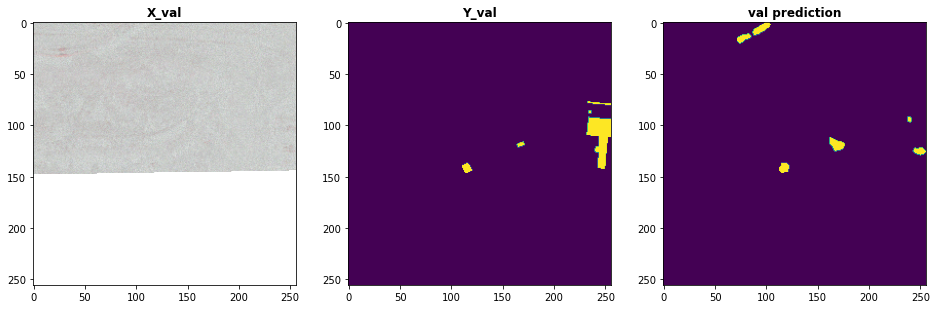

index: 46
test preds  set


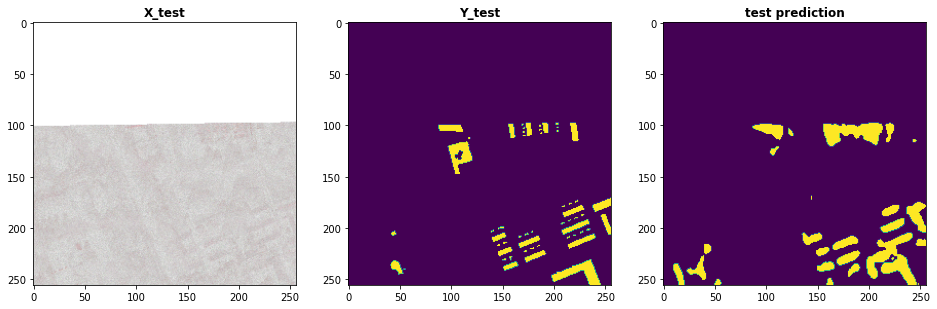

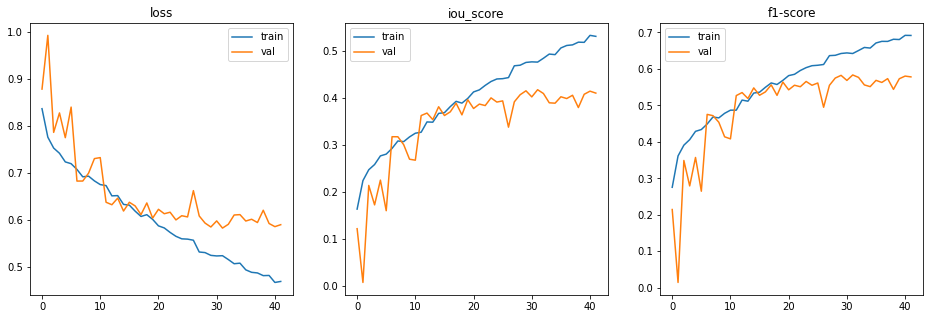

In [ ]:
''' plot predictions to visualize ''' 
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
if results != None:
  plot_history(results.history)

### ID 67

In [ ]:
''' set the train/test ''' 
IMG_TYPE, IMG_WIDTH, IMG_HEIGHT, IMG_ROTATED, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE = gen_input_image_details('SAR-Intensity', False)       # CHANGE HERE
PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK, PATH_SAMPLE, PATH_SAVED_MODELS = gen_paths(IMG_TYPE, IMG_ROTATED)
if IMG_ROTATED:
  X_train, Y_train, X_test, Y_test = X_train_rotate, Y_train_rotate, X_test_rotate, Y_test_rotate
else:
  X_train, Y_train, X_test, Y_test = X_train_no_rotate, Y_train_no_rotate, X_test_no_rotate, Y_test_no_rotate

gen_input_image_details()
IMG_TYPE: SAR-Intensity, IMG_HEIGHT: 256, IMG_WIDTH: 256, IMG_ROTATED: False, IMG_CHANNELS: 4, IMG_DTYPE_SRC: <class 'numpy.float32'>, IMG_DTYPE: <class 'numpy.uint8'>

gen_paths()
PATH_SRC: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam, 
PATH_SRC_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/SAR-Intensity, 
PATH_SRC_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/_mask, 
PATH_DATA: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256, 
PATH_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/image, 
PATH_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/mask, 
PATH_SAMPLE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/sample, 
P

In [ ]:
''' set the model parameters, train model '''
MODEL_OPTIMIZER, MODEL_LOSS, MODEL_METRICS, MODEL_VAL_SPLIT, MODEL_VAL_OFFSET, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_ID, MODEL_NAME, model = gen_model(
    BinaryFocalLoss(alpha=0.5, gamma=1), 8, 100, 'segmentation-models Unet', 'efficientnetb0', 'BinaryFocalLoss(alpha=0.5, gamma=1)', IMG_CHANNELS, MODEL_ID=67, MODEL_COMMENTS='batch size test, early stopping patience 10')          # CHANGE HERE

results, model = gen_model_results(PATH_SAVED_MODELS, MODEL_NAME, X_train, Y_train, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_VAL_SPLIT, 
                                   load_weights_filename='', load_weights_epochs=0, save_model=True)                                            # CHANGE HERE

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


No weights loaded. Training new model
Train on 720 samples, validate on 80 samples
Epoch 1/100
720/720 [==============================] - 49s 69ms/step - loss: 0.8453 - iou_score: 0.1547 - f1-score: 0.2630 - val_loss: 0.8465 - val_iou_score: 0.1535 - val_f1-score: 0.2627
Epoch 2/100
720/720 [==============================] - 28s 39ms/step - loss: 0.7716 - iou_score: 0.2284 - f1-score: 0.3673 - val_loss: 0.9656 - val_iou_score: 0.0344 - val_f1-score: 0.0657
Epoch 3/100
720/720 [==============================] - 28s 39ms/step - loss: 0.7412 - iou_score: 0.2588 - f1-score: 0.4076 - val_loss: 0.7606 - val_iou_score: 0.2394 - val_f1-score: 0.3786
Epoch 4/100
720/720 [==============================] - 28s 39ms/step - loss: 0.7311 - iou_score: 0.2689 - f1-score: 0.4177 - val_loss: 0.7108 - val_iou_score: 0.2892 - val_f1-score: 0.4392
Epoch 5/100
720/720 [==============================] - 28s 39ms/step - loss: 0.7190 - iou_score: 0.2810 - f1-score: 0.4339 - val_loss: 0.6758 - val_iou_score: 0.

In [ ]:
''' predict using model '''
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_NAME, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_BATCH_SIZE, MODEL_EPOCHS)

80/80 [==============================] - 1s 8ms/step
train set evaluation
720/720 [==============================] - 5s 8ms/step
loss :  0.5188552843199836
iou_score :  0.4809097349643707
f1-score :  0.6479842066764832

validation set evaluation
80/80 [==============================] - 1s 8ms/step
loss :  0.9036496162414551
iou_score :  0.10167974978685379
f1-score :  0.1839037388563156

test set evaluation
80/80 [==============================] - 1s 8ms/step
loss :  0.6646407723426819
iou_score :  0.351237416267395
f1-score :  0.517340362071991
saved model metrics


index: 317
train preds  set


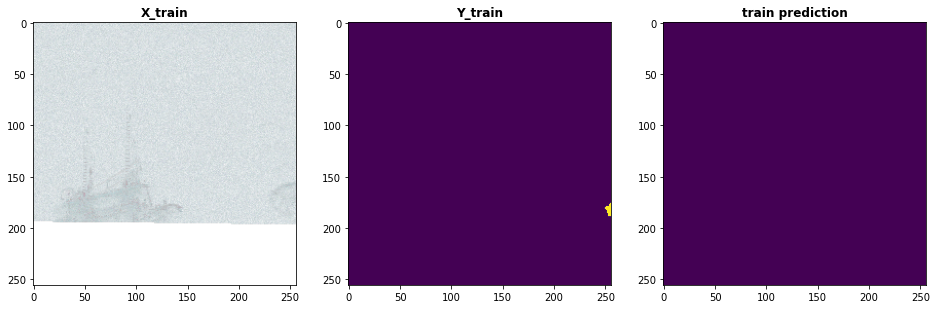

index: 48
val preds  set


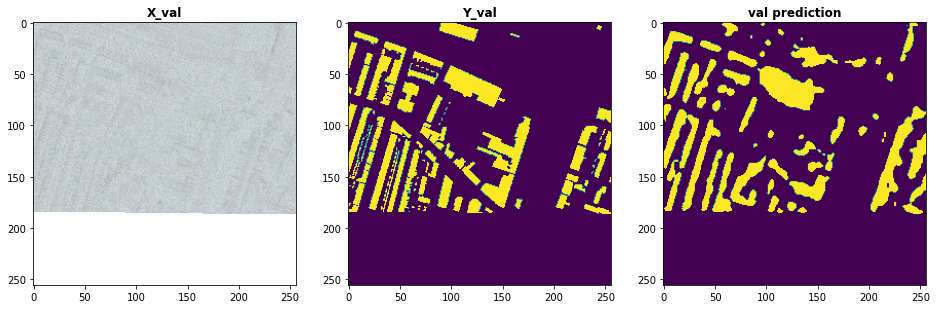

index: 73
test preds  set


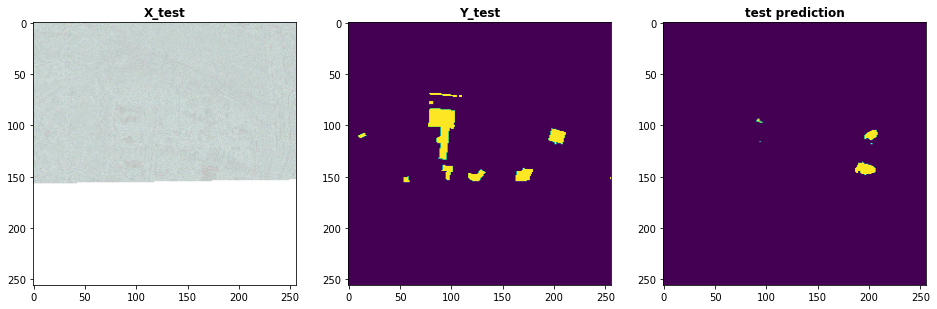

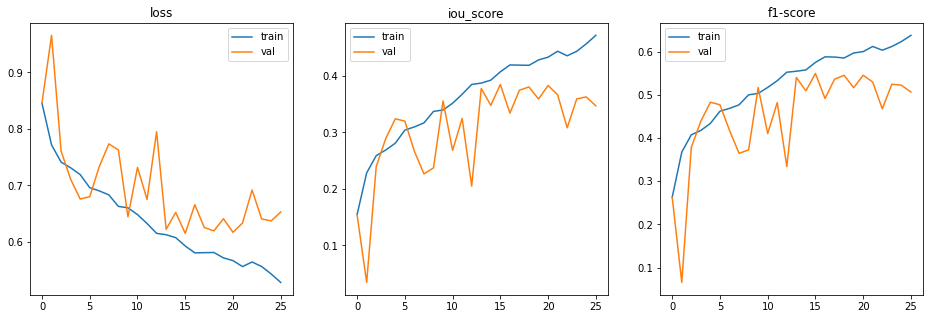

In [ ]:
''' plot predictions to visualize ''' 
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
if results != None:
  plot_history(results.history)

### ID 68

In [ ]:
''' set the train/test ''' 
IMG_TYPE, IMG_WIDTH, IMG_HEIGHT, IMG_ROTATED, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE = gen_input_image_details('SAR-Intensity', False)       # CHANGE HERE
PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK, PATH_SAMPLE, PATH_SAVED_MODELS = gen_paths(IMG_TYPE, IMG_ROTATED)
if IMG_ROTATED:
  X_train, Y_train, X_test, Y_test = X_train_rotate, Y_train_rotate, X_test_rotate, Y_test_rotate
else:
  X_train, Y_train, X_test, Y_test = X_train_no_rotate, Y_train_no_rotate, X_test_no_rotate, Y_test_no_rotate

gen_input_image_details()
IMG_TYPE: SAR-Intensity, IMG_HEIGHT: 256, IMG_WIDTH: 256, IMG_ROTATED: False, IMG_CHANNELS: 4, IMG_DTYPE_SRC: <class 'numpy.float32'>, IMG_DTYPE: <class 'numpy.uint8'>

gen_paths()
PATH_SRC: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam, 
PATH_SRC_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/SAR-Intensity, 
PATH_SRC_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/_mask, 
PATH_DATA: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256, 
PATH_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/image, 
PATH_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/mask, 
PATH_SAMPLE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/sample, 
P

In [ ]:
''' set the model parameters, train model '''
MODEL_OPTIMIZER, MODEL_LOSS, MODEL_METRICS, MODEL_VAL_SPLIT, MODEL_VAL_OFFSET, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_ID, MODEL_NAME, model = gen_model(
    BinaryFocalLoss(alpha=0.5, gamma=1), 8, 100, 'segmentation-models Unet', 'efficientnetb0', 'BinaryFocalLoss(alpha=0.5, gamma=1)', IMG_CHANNELS, MODEL_ID=68, MODEL_COMMENTS='batch size test, early stopping patience 10')          # CHANGE HERE

results, model = gen_model_results(PATH_SAVED_MODELS, MODEL_NAME, X_train, Y_train, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_VAL_SPLIT, 
                                   load_weights_filename='', load_weights_epochs=0, save_model=True)                                            # CHANGE HERE

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


No weights loaded. Training new model
Train on 720 samples, validate on 80 samples
Epoch 1/100
720/720 [==============================] - 50s 69ms/step - loss: 0.8417 - iou_score: 0.1583 - f1-score: 0.2684 - val_loss: 0.8787 - val_iou_score: 0.1213 - val_f1-score: 0.2143
Epoch 2/100
720/720 [==============================] - 28s 39ms/step - loss: 0.7636 - iou_score: 0.2364 - f1-score: 0.3791 - val_loss: 0.9008 - val_iou_score: 0.0992 - val_f1-score: 0.1785
Epoch 3/100
720/720 [==============================] - 28s 39ms/step - loss: 0.7514 - iou_score: 0.2486 - f1-score: 0.3921 - val_loss: 0.9456 - val_iou_score: 0.0544 - val_f1-score: 0.1013
Epoch 4/100
720/720 [==============================] - 28s 39ms/step - loss: 0.7376 - iou_score: 0.2624 - f1-score: 0.4111 - val_loss: 0.7261 - val_iou_score: 0.2739 - val_f1-score: 0.4193
Epoch 5/100
720/720 [==============================] - 28s 39ms/step - loss: 0.7252 - iou_score: 0.2748 - f1-score: 0.4263 - val_loss: 0.7109 - val_iou_score: 0.

In [ ]:
''' predict using model '''
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_NAME, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_BATCH_SIZE, MODEL_EPOCHS)

80/80 [==============================] - 1s 8ms/step
train set evaluation
720/720 [==============================] - 5s 8ms/step
loss :  0.4959737949901157
iou_score :  0.504498302936554
f1-score :  0.6700754761695862

validation set evaluation
80/80 [==============================] - 1s 8ms/step
loss :  0.7690067291259766
iou_score :  0.24163322150707245
f1-score :  0.3868626058101654

test set evaluation
80/80 [==============================] - 1s 8ms/step
loss :  0.6153053998947143
iou_score :  0.3919715881347656
f1-score :  0.5623573660850525
saved model metrics


index: 125
train preds  set


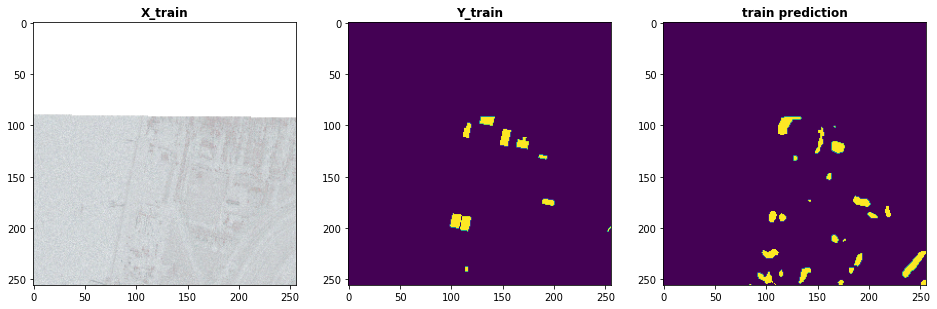

index: 26
val preds  set


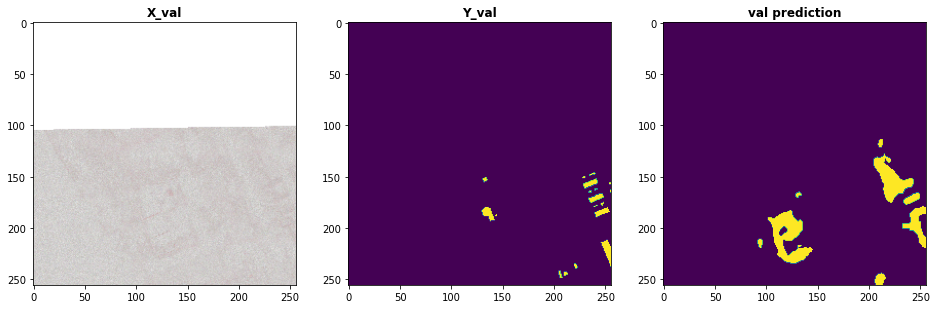

index: 32
test preds  set


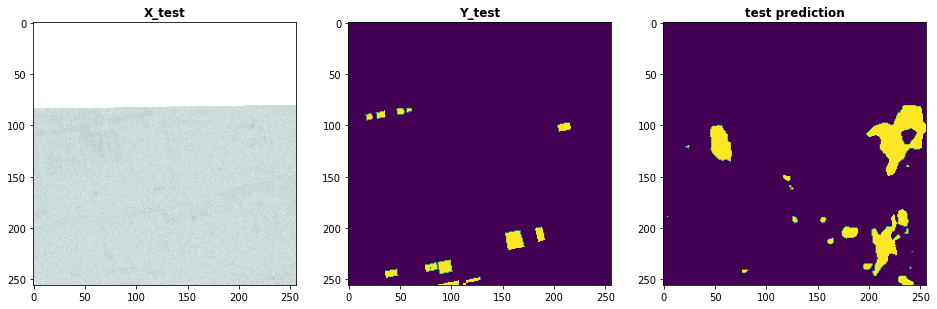

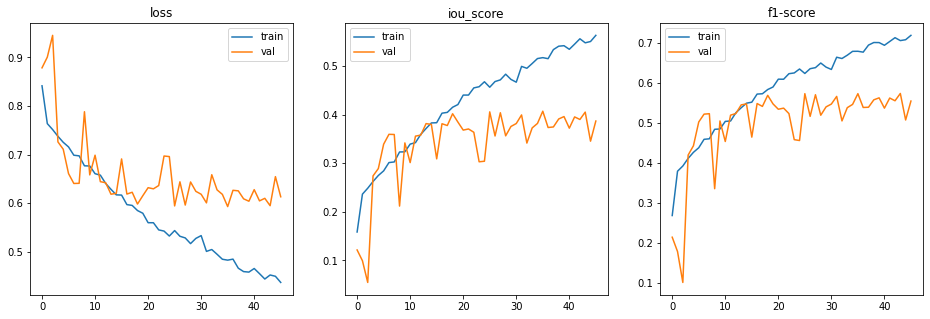

In [ ]:
''' plot predictions to visualize ''' 
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
if results != None:
  plot_history(results.history)

### ID 69

In [ ]:
''' set the train/test ''' 
IMG_TYPE, IMG_WIDTH, IMG_HEIGHT, IMG_ROTATED, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE = gen_input_image_details('SAR-Intensity', False)       # CHANGE HERE
PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK, PATH_SAMPLE, PATH_SAVED_MODELS = gen_paths(IMG_TYPE, IMG_ROTATED)
if IMG_ROTATED:
  X_train, Y_train, X_test, Y_test = X_train_rotate, Y_train_rotate, X_test_rotate, Y_test_rotate
else:
  X_train, Y_train, X_test, Y_test = X_train_no_rotate, Y_train_no_rotate, X_test_no_rotate, Y_test_no_rotate

gen_input_image_details()
IMG_TYPE: SAR-Intensity, IMG_HEIGHT: 256, IMG_WIDTH: 256, IMG_ROTATED: False, IMG_CHANNELS: 4, IMG_DTYPE_SRC: <class 'numpy.float32'>, IMG_DTYPE: <class 'numpy.uint8'>

gen_paths()
PATH_SRC: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam, 
PATH_SRC_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/SAR-Intensity, 
PATH_SRC_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/_mask, 
PATH_DATA: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256, 
PATH_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/image, 
PATH_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/mask, 
PATH_SAMPLE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/sample, 
P

In [ ]:
''' set the model parameters, train model '''
MODEL_OPTIMIZER, MODEL_LOSS, MODEL_METRICS, MODEL_VAL_SPLIT, MODEL_VAL_OFFSET, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_ID, MODEL_NAME, model = gen_model(
    BinaryFocalLoss(alpha=0.5, gamma=1), 8, 100, 'segmentation-models Unet', 'efficientnetb0', 'BinaryFocalLoss(alpha=0.5, gamma=1)', IMG_CHANNELS, MODEL_ID=69, MODEL_COMMENTS='batch size test, early stopping patience 10')          # CHANGE HERE

results, model = gen_model_results(PATH_SAVED_MODELS, MODEL_NAME, X_train, Y_train, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_VAL_SPLIT, 
                                   load_weights_filename='', load_weights_epochs=0, save_model=True)                                            # CHANGE HERE

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


No weights loaded. Training new model
Train on 720 samples, validate on 80 samples
Epoch 1/100
720/720 [==============================] - 50s 69ms/step - loss: 0.8544 - iou_score: 0.1456 - f1-score: 0.2487 - val_loss: 0.8946 - val_iou_score: 0.1054 - val_f1-score: 0.1894
Epoch 2/100
720/720 [==============================] - 28s 39ms/step - loss: 0.7674 - iou_score: 0.2326 - f1-score: 0.3740 - val_loss: 0.9604 - val_iou_score: 0.0396 - val_f1-score: 0.0758
Epoch 3/100
720/720 [==============================] - 28s 39ms/step - loss: 0.7501 - iou_score: 0.2499 - f1-score: 0.3949 - val_loss: 0.9018 - val_iou_score: 0.0982 - val_f1-score: 0.1769
Epoch 4/100
720/720 [==============================] - 28s 39ms/step - loss: 0.7219 - iou_score: 0.2781 - f1-score: 0.4310 - val_loss: 0.7751 - val_iou_score: 0.2249 - val_f1-score: 0.3533
Epoch 5/100
720/720 [==============================] - 28s 39ms/step - loss: 0.7116 - iou_score: 0.2884 - f1-score: 0.4426 - val_loss: 0.8548 - val_iou_score: 0.

In [ ]:
''' predict using model '''
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_NAME, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_BATCH_SIZE, MODEL_EPOCHS)

80/80 [==============================] - 1s 8ms/step
train set evaluation
720/720 [==============================] - 5s 8ms/step
loss :  0.3773749113082886
iou_score :  0.6226732730865479
f1-score :  0.7667859792709351

validation set evaluation
80/80 [==============================] - 1s 8ms/step
loss :  0.8826295137405396
iou_score :  0.12702126801013947
f1-score :  0.22363562881946564

test set evaluation
80/80 [==============================] - 1s 8ms/step
loss :  0.5935919046401977
iou_score :  0.41578856110572815
f1-score :  0.5865713953971863
saved model metrics


index: 149
train preds  set


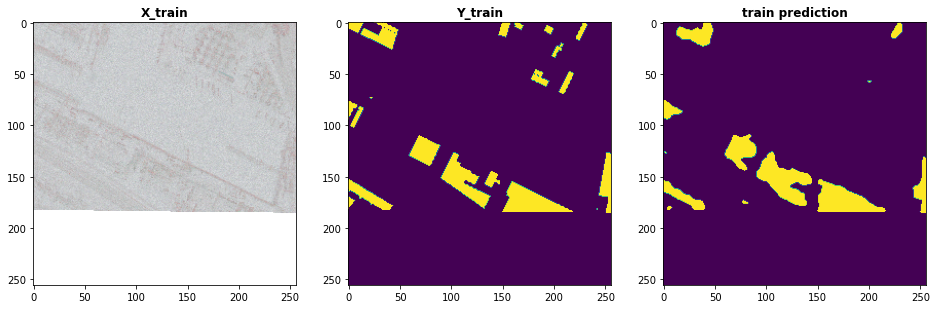

index: 48
val preds  set


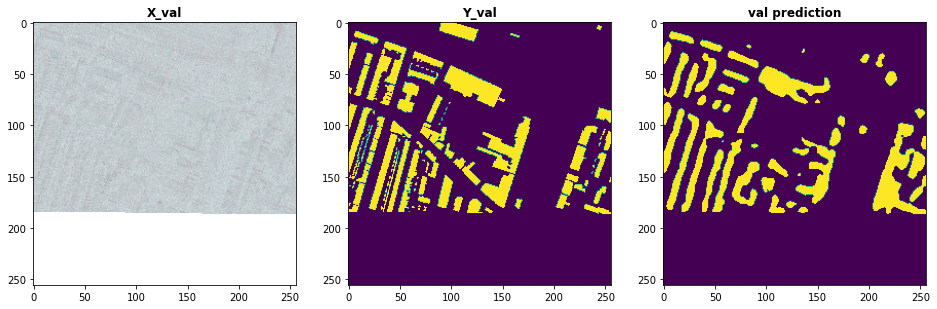

index: 60
test preds  set


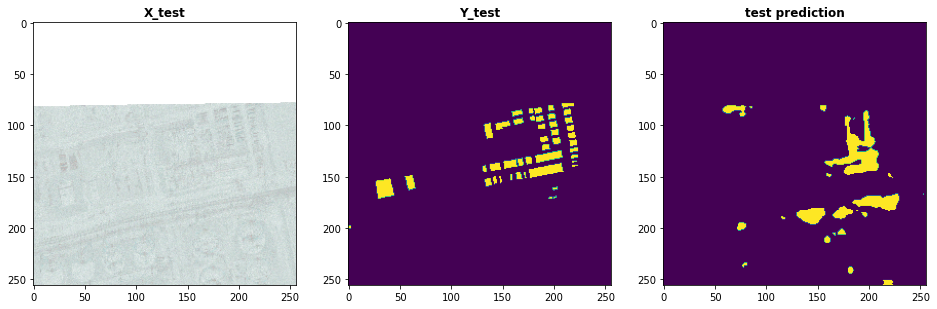

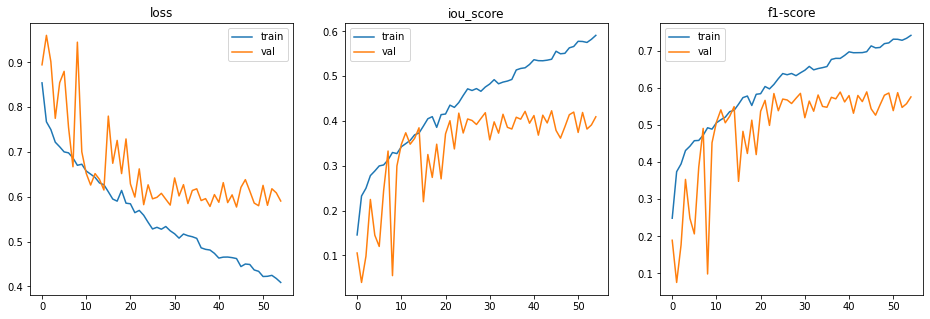

In [ ]:
''' plot predictions to visualize ''' 
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
if results != None:
  plot_history(results.history)

### ID 70

In [ ]:
''' set the train/test ''' 
IMG_TYPE, IMG_WIDTH, IMG_HEIGHT, IMG_ROTATED, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE = gen_input_image_details('SAR-Intensity', False)       # CHANGE HERE
PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK, PATH_SAMPLE, PATH_SAVED_MODELS = gen_paths(IMG_TYPE, IMG_ROTATED)
if IMG_ROTATED:
  X_train, Y_train, X_test, Y_test = X_train_rotate, Y_train_rotate, X_test_rotate, Y_test_rotate
else:
  X_train, Y_train, X_test, Y_test = X_train_no_rotate, Y_train_no_rotate, X_test_no_rotate, Y_test_no_rotate

gen_input_image_details()
IMG_TYPE: SAR-Intensity, IMG_HEIGHT: 256, IMG_WIDTH: 256, IMG_ROTATED: False, IMG_CHANNELS: 4, IMG_DTYPE_SRC: <class 'numpy.float32'>, IMG_DTYPE: <class 'numpy.uint8'>

gen_paths()
PATH_SRC: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam, 
PATH_SRC_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/SAR-Intensity, 
PATH_SRC_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/_mask, 
PATH_DATA: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256, 
PATH_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/image, 
PATH_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/mask, 
PATH_SAMPLE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/sample, 
P

In [ ]:
''' set the model parameters, train model '''
MODEL_OPTIMIZER, MODEL_LOSS, MODEL_METRICS, MODEL_VAL_SPLIT, MODEL_VAL_OFFSET, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_ID, MODEL_NAME, model = gen_model(
    BinaryFocalLoss(alpha=0.5, gamma=1), 8, 100, 'segmentation-models Unet', 'efficientnetb0', 'BinaryFocalLoss(alpha=0.5, gamma=1)', IMG_CHANNELS, MODEL_ID=70, MODEL_COMMENTS='batch size test, early stopping patience 10')          # CHANGE HERE

results, model = gen_model_results(PATH_SAVED_MODELS, MODEL_NAME, X_train, Y_train, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_VAL_SPLIT, 
                                   load_weights_filename='', load_weights_epochs=0, save_model=True)                                            # CHANGE HERE

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


No weights loaded. Training new model
Train on 720 samples, validate on 80 samples
Epoch 1/100
720/720 [==============================] - 50s 69ms/step - loss: 0.8475 - iou_score: 0.1525 - f1-score: 0.2608 - val_loss: 0.8891 - val_iou_score: 0.1109 - val_f1-score: 0.1983
Epoch 2/100
720/720 [==============================] - 28s 39ms/step - loss: 0.7734 - iou_score: 0.2266 - f1-score: 0.3658 - val_loss: 0.8149 - val_iou_score: 0.1851 - val_f1-score: 0.3078
Epoch 3/100
720/720 [==============================] - 28s 38ms/step - loss: 0.7416 - iou_score: 0.2584 - f1-score: 0.4065 - val_loss: 0.9392 - val_iou_score: 0.0608 - val_f1-score: 0.1115
Epoch 4/100
720/720 [==============================] - 28s 39ms/step - loss: 0.7287 - iou_score: 0.2713 - f1-score: 0.4222 - val_loss: 0.7148 - val_iou_score: 0.2852 - val_f1-score: 0.4320
Epoch 5/100
720/720 [==============================] - 28s 39ms/step - loss: 0.7086 - iou_score: 0.2914 - f1-score: 0.4458 - val_loss: 0.9895 - val_iou_score: 0.

In [ ]:
''' predict using model '''
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_NAME, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_BATCH_SIZE, MODEL_EPOCHS)

80/80 [==============================] - 1s 8ms/step
train set evaluation
720/720 [==============================] - 5s 8ms/step
loss :  0.4050754348436991
iou_score :  0.5947762131690979
f1-score :  0.745267391204834

validation set evaluation
80/80 [==============================] - 1s 8ms/step
loss :  0.8331445693969727
iou_score :  0.18046842515468597
f1-score :  0.30264899134635925

test set evaluation
80/80 [==============================] - 1s 8ms/step
loss :  0.5944554567337036
iou_score :  0.4131152331829071
f1-score :  0.5840438008308411
saved model metrics


index: 153
train preds  set


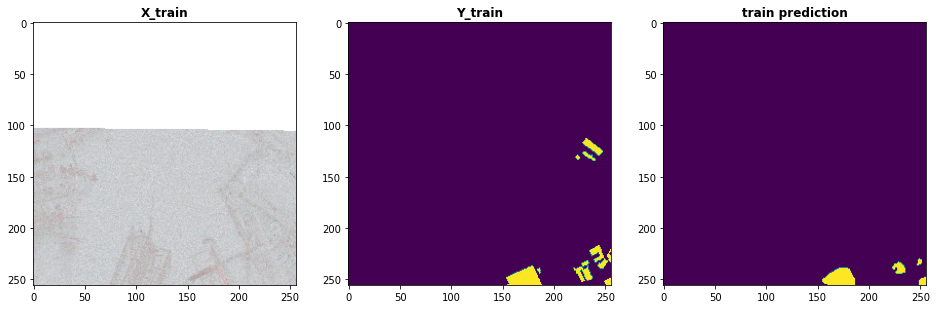

index: 50
val preds  set


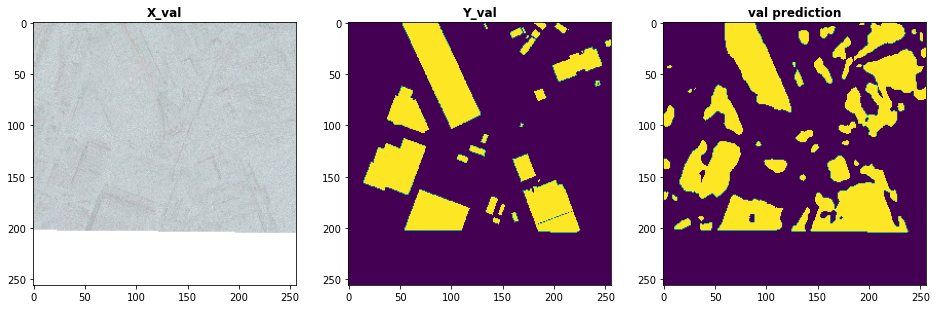

index: 44
test preds  set


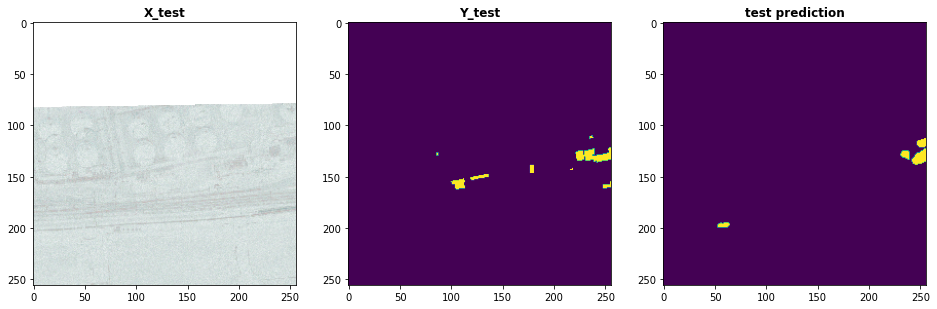

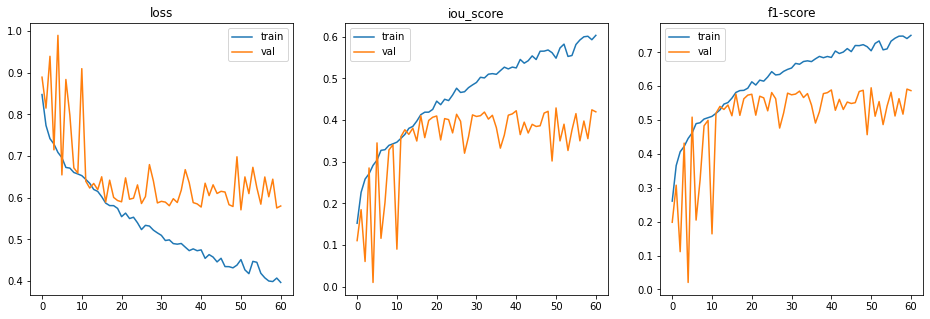

In [ ]:
''' plot predictions to visualize ''' 
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
if results != None:
  plot_history(results.history)

## Experiment 1H: batch size 4

### ID 71

In [ ]:
''' set the train/test ''' 
IMG_TYPE, IMG_WIDTH, IMG_HEIGHT, IMG_ROTATED, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE = gen_input_image_details('SAR-Intensity', False)       # CHANGE HERE
PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK, PATH_SAMPLE, PATH_SAVED_MODELS = gen_paths(IMG_TYPE, IMG_ROTATED)
if IMG_ROTATED:
  X_train, Y_train, X_test, Y_test = X_train_rotate, Y_train_rotate, X_test_rotate, Y_test_rotate
else:
  X_train, Y_train, X_test, Y_test = X_train_no_rotate, Y_train_no_rotate, X_test_no_rotate, Y_test_no_rotate

gen_input_image_details()
IMG_TYPE: SAR-Intensity, IMG_HEIGHT: 256, IMG_WIDTH: 256, IMG_ROTATED: False, IMG_CHANNELS: 4, IMG_DTYPE_SRC: <class 'numpy.float32'>, IMG_DTYPE: <class 'numpy.uint8'>

gen_paths()
PATH_SRC: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam, 
PATH_SRC_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/SAR-Intensity, 
PATH_SRC_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/_mask, 
PATH_DATA: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256, 
PATH_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/image, 
PATH_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/mask, 
PATH_SAMPLE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/sample, 
P

In [ ]:
''' set the model parameters, train model '''
MODEL_OPTIMIZER, MODEL_LOSS, MODEL_METRICS, MODEL_VAL_SPLIT, MODEL_VAL_OFFSET, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_ID, MODEL_NAME, model = gen_model(
    BinaryFocalLoss(alpha=0.5, gamma=1), 4, 100, 'segmentation-models Unet', 'efficientnetb0', 'BinaryFocalLoss(alpha=0.5, gamma=1)', IMG_CHANNELS, MODEL_ID=71, MODEL_COMMENTS='batch size test, early stopping patience 10')          # CHANGE HERE

results, model = gen_model_results(PATH_SAVED_MODELS, MODEL_NAME, X_train, Y_train, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_VAL_SPLIT, 
                                   load_weights_filename='', load_weights_epochs=0, save_model=True)                                            # CHANGE HERE

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


No weights loaded. Training new model
Train on 720 samples, validate on 80 samples
Epoch 1/100
720/720 [==============================] - 61s 84ms/step - loss: 0.8290 - iou_score: 0.1710 - f1-score: 0.2834 - val_loss: 0.9880 - val_iou_score: 0.0120 - val_f1-score: 0.0234
Epoch 2/100
720/720 [==============================] - 35s 48ms/step - loss: 0.7771 - iou_score: 0.2229 - f1-score: 0.3555 - val_loss: 0.7882 - val_iou_score: 0.2118 - val_f1-score: 0.3304
Epoch 3/100
720/720 [==============================] - 35s 48ms/step - loss: 0.7583 - iou_score: 0.2417 - f1-score: 0.3793 - val_loss: 0.7895 - val_iou_score: 0.2105 - val_f1-score: 0.3267
Epoch 4/100
720/720 [==============================] - 35s 48ms/step - loss: 0.7424 - iou_score: 0.2576 - f1-score: 0.3979 - val_loss: 0.8173 - val_iou_score: 0.1827 - val_f1-score: 0.2901
Epoch 5/100
720/720 [==============================] - 35s 48ms/step - loss: 0.7296 - iou_score: 0.2704 - f1-score: 0.4154 - val_loss: 0.7383 - val_iou_score: 0.

In [ ]:
''' predict using model '''
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_NAME, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_BATCH_SIZE, MODEL_EPOCHS)

80/80 [==============================] - 1s 8ms/step
train set evaluation
720/720 [==============================] - 5s 8ms/step
loss :  0.4643276002671983
iou_score :  0.5350202918052673
f1-score :  0.6959237456321716

validation set evaluation
80/80 [==============================] - 1s 9ms/step
loss :  0.9215806007385254
iou_score :  0.0842914953827858
f1-score :  0.1546672135591507

test set evaluation
80/80 [==============================] - 1s 8ms/step
loss :  0.6580034255981445
iou_score :  0.35415008664131165
f1-score :  0.5212977528572083
saved model metrics


index: 691
train preds  set


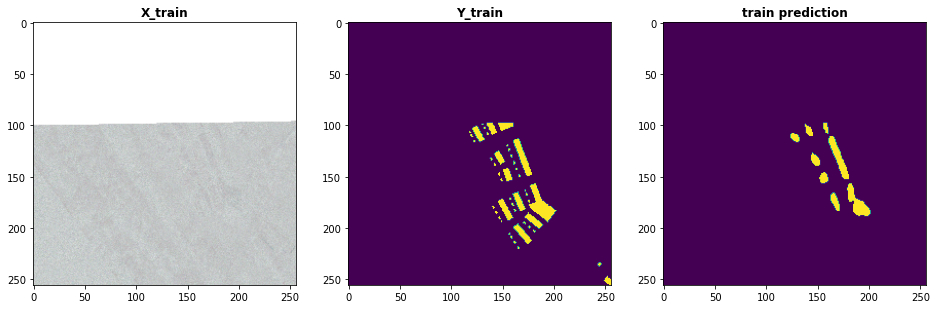

index: 4
val preds  set


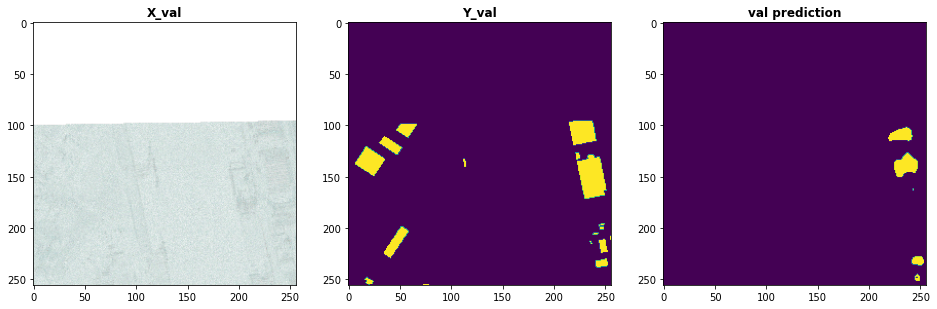

index: 19
test preds  set


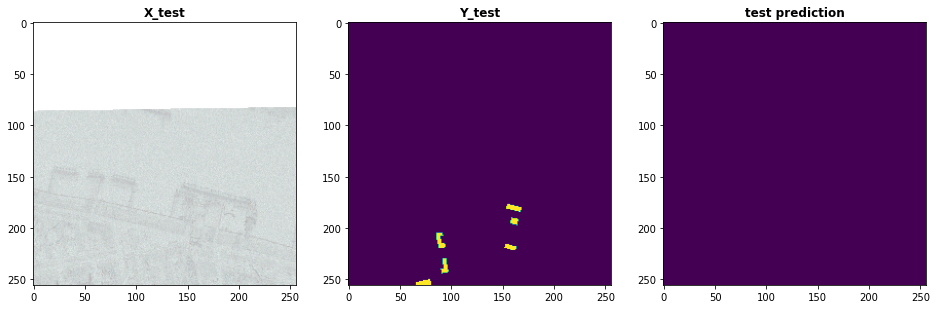

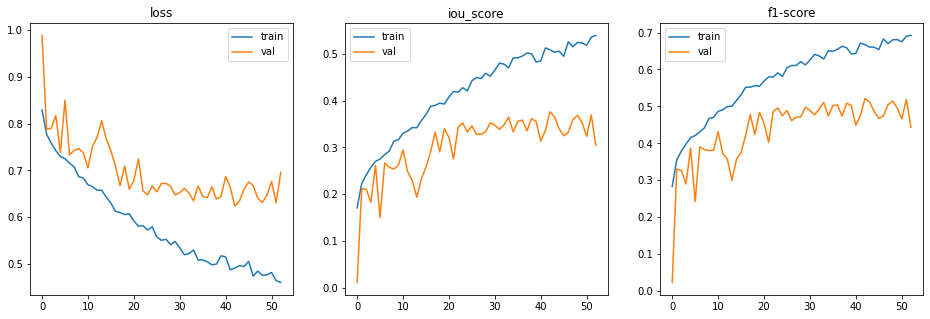

In [ ]:
''' plot predictions to visualize ''' 
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
if results != None:
  plot_history(results.history)

### ID 72

In [ ]:
''' set the train/test ''' 
IMG_TYPE, IMG_WIDTH, IMG_HEIGHT, IMG_ROTATED, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE = gen_input_image_details('SAR-Intensity', False)       # CHANGE HERE
PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK, PATH_SAMPLE, PATH_SAVED_MODELS = gen_paths(IMG_TYPE, IMG_ROTATED)
if IMG_ROTATED:
  X_train, Y_train, X_test, Y_test = X_train_rotate, Y_train_rotate, X_test_rotate, Y_test_rotate
else:
  X_train, Y_train, X_test, Y_test = X_train_no_rotate, Y_train_no_rotate, X_test_no_rotate, Y_test_no_rotate

gen_input_image_details()
IMG_TYPE: SAR-Intensity, IMG_HEIGHT: 256, IMG_WIDTH: 256, IMG_ROTATED: False, IMG_CHANNELS: 4, IMG_DTYPE_SRC: <class 'numpy.float32'>, IMG_DTYPE: <class 'numpy.uint8'>

gen_paths()
PATH_SRC: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam, 
PATH_SRC_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/SAR-Intensity, 
PATH_SRC_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/_mask, 
PATH_DATA: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256, 
PATH_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/image, 
PATH_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/mask, 
PATH_SAMPLE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/sample, 
P

In [ ]:
''' set the model parameters, train model '''
MODEL_OPTIMIZER, MODEL_LOSS, MODEL_METRICS, MODEL_VAL_SPLIT, MODEL_VAL_OFFSET, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_ID, MODEL_NAME, model = gen_model(
    BinaryFocalLoss(alpha=0.5, gamma=1), 4, 100, 'segmentation-models Unet', 'efficientnetb0', 'BinaryFocalLoss(alpha=0.5, gamma=1)', IMG_CHANNELS, MODEL_ID=72, MODEL_COMMENTS='batch size test, early stopping patience 10')          # CHANGE HERE

results, model = gen_model_results(PATH_SAVED_MODELS, MODEL_NAME, X_train, Y_train, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_VAL_SPLIT, 
                                   load_weights_filename='', load_weights_epochs=0, save_model=True)                                            # CHANGE HERE

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


No weights loaded. Training new model
Train on 720 samples, validate on 80 samples
Epoch 1/100
720/720 [==============================] - 58s 80ms/step - loss: 0.8425 - iou_score: 0.1575 - f1-score: 0.2634 - val_loss: 0.9644 - val_iou_score: 0.0356 - val_f1-score: 0.0667
Epoch 2/100
720/720 [==============================] - 35s 49ms/step - loss: 0.7749 - iou_score: 0.2251 - f1-score: 0.3597 - val_loss: 0.7733 - val_iou_score: 0.2267 - val_f1-score: 0.3402
Epoch 3/100
720/720 [==============================] - 37s 51ms/step - loss: 0.7640 - iou_score: 0.2360 - f1-score: 0.3712 - val_loss: 0.7709 - val_iou_score: 0.2291 - val_f1-score: 0.3546
Epoch 4/100
720/720 [==============================] - 35s 49ms/step - loss: 0.7450 - iou_score: 0.2550 - f1-score: 0.3967 - val_loss: 0.7647 - val_iou_score: 0.2353 - val_f1-score: 0.3554
Epoch 5/100
720/720 [==============================] - 35s 49ms/step - loss: 0.7353 - iou_score: 0.2647 - f1-score: 0.4083 - val_loss: 0.8053 - val_iou_score: 0.

In [ ]:
''' predict using model '''
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_NAME, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_BATCH_SIZE, MODEL_EPOCHS)

80/80 [==============================] - 1s 8ms/step
train set evaluation
720/720 [==============================] - 6s 8ms/step
loss :  0.4633888284365336
iou_score :  0.5368089079856873
f1-score :  0.6978611946105957

validation set evaluation
80/80 [==============================] - 1s 9ms/step
loss :  0.8058203220367431
iou_score :  0.20960621535778046
f1-score :  0.3424335718154907

test set evaluation
80/80 [==============================] - 1s 8ms/step
loss :  0.5714995861053467
iou_score :  0.4336613416671753
f1-score :  0.6045201420783997
saved model metrics


index: 478
train preds  set


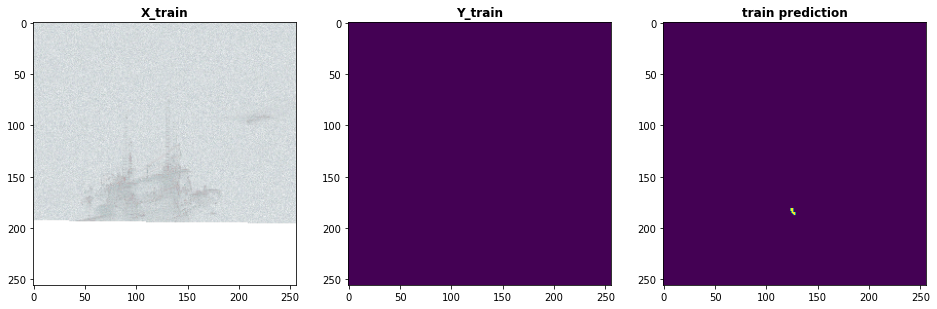

index: 34
val preds  set


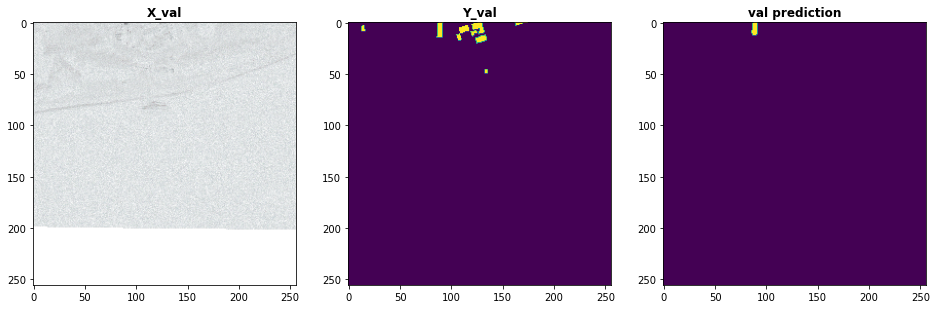

index: 23
test preds  set


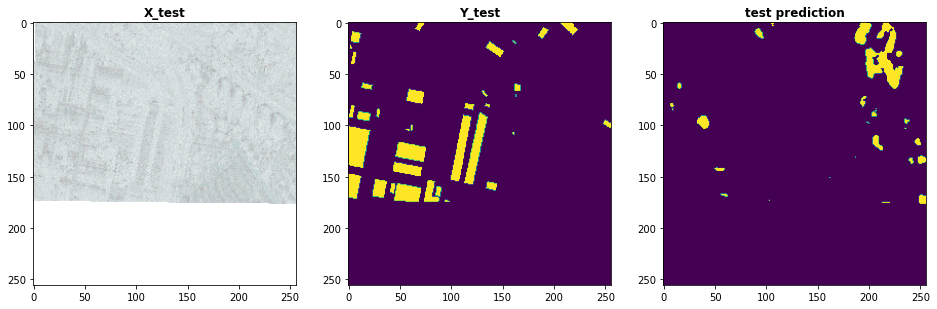

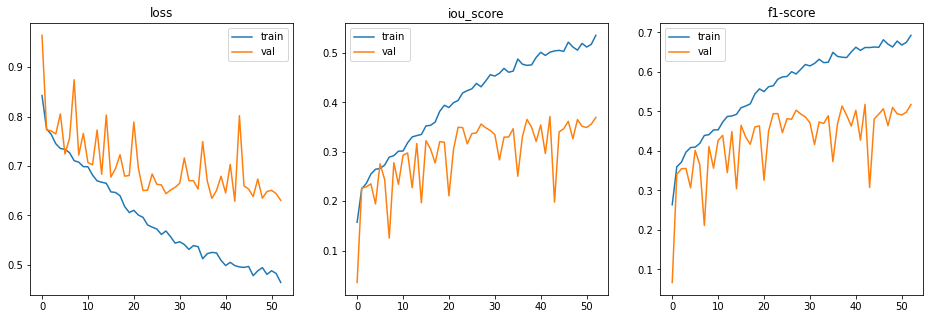

In [ ]:
''' plot predictions to visualize ''' 
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
if results != None:
  plot_history(results.history)

### ID 73

In [ ]:
''' set the train/test ''' 
IMG_TYPE, IMG_WIDTH, IMG_HEIGHT, IMG_ROTATED, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE = gen_input_image_details('SAR-Intensity', False)       # CHANGE HERE
PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK, PATH_SAMPLE, PATH_SAVED_MODELS = gen_paths(IMG_TYPE, IMG_ROTATED)
if IMG_ROTATED:
  X_train, Y_train, X_test, Y_test = X_train_rotate, Y_train_rotate, X_test_rotate, Y_test_rotate
else:
  X_train, Y_train, X_test, Y_test = X_train_no_rotate, Y_train_no_rotate, X_test_no_rotate, Y_test_no_rotate

gen_input_image_details()
IMG_TYPE: SAR-Intensity, IMG_HEIGHT: 256, IMG_WIDTH: 256, IMG_ROTATED: False, IMG_CHANNELS: 4, IMG_DTYPE_SRC: <class 'numpy.float32'>, IMG_DTYPE: <class 'numpy.uint8'>

gen_paths()
PATH_SRC: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam, 
PATH_SRC_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/SAR-Intensity, 
PATH_SRC_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/_mask, 
PATH_DATA: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256, 
PATH_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/image, 
PATH_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/mask, 
PATH_SAMPLE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/sample, 
P

In [ ]:
''' set the model parameters, train model '''
MODEL_OPTIMIZER, MODEL_LOSS, MODEL_METRICS, MODEL_VAL_SPLIT, MODEL_VAL_OFFSET, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_ID, MODEL_NAME, model = gen_model(
    BinaryFocalLoss(alpha=0.5, gamma=1), 4, 100, 'segmentation-models Unet', 'efficientnetb0', 'BinaryFocalLoss(alpha=0.5, gamma=1)', IMG_CHANNELS, MODEL_ID=73, MODEL_COMMENTS='batch size test, early stopping patience 10')          # CHANGE HERE

results, model = gen_model_results(PATH_SAVED_MODELS, MODEL_NAME, X_train, Y_train, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_VAL_SPLIT, 
                                   load_weights_filename='', load_weights_epochs=0, save_model=True)                                            # CHANGE HERE

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


No weights loaded. Training new model
Train on 720 samples, validate on 80 samples
Epoch 1/100
720/720 [==============================] - 57s 80ms/step - loss: 0.8241 - iou_score: 0.1759 - f1-score: 0.2904 - val_loss: 0.8322 - val_iou_score: 0.1678 - val_f1-score: 0.2750
Epoch 2/100
720/720 [==============================] - 35s 49ms/step - loss: 0.7691 - iou_score: 0.2309 - f1-score: 0.3660 - val_loss: 0.7993 - val_iou_score: 0.2007 - val_f1-score: 0.3132
Epoch 3/100
720/720 [==============================] - 35s 49ms/step - loss: 0.7548 - iou_score: 0.2452 - f1-score: 0.3834 - val_loss: 0.7549 - val_iou_score: 0.2451 - val_f1-score: 0.3673
Epoch 4/100
720/720 [==============================] - 35s 49ms/step - loss: 0.7438 - iou_score: 0.2562 - f1-score: 0.3976 - val_loss: 0.7337 - val_iou_score: 0.2663 - val_f1-score: 0.3979
Epoch 5/100
720/720 [==============================] - 35s 49ms/step - loss: 0.7321 - iou_score: 0.2679 - f1-score: 0.4119 - val_loss: 0.7561 - val_iou_score: 0.

In [ ]:
''' predict using model '''
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_NAME, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_BATCH_SIZE, MODEL_EPOCHS)

80/80 [==============================] - 1s 7ms/step
train set evaluation
720/720 [==============================] - 5s 8ms/step
loss :  0.4549506968922085
iou_score :  0.5445470213890076
f1-score :  0.7041691541671753

validation set evaluation
80/80 [==============================] - 1s 9ms/step
loss :  0.8752863645553589
iou_score :  0.134812593460083
f1-score :  0.23568785190582275

test set evaluation
80/80 [==============================] - 1s 8ms/step
loss :  0.5917783260345459
iou_score :  0.41836437582969666
f1-score :  0.5890362858772278
saved model metrics


index: 444
train preds  set


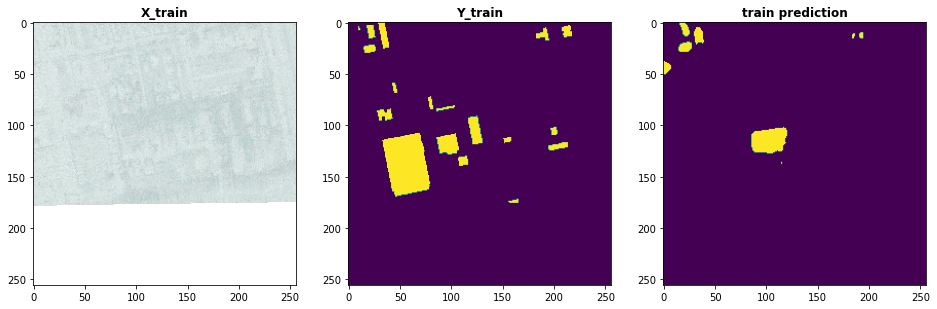

index: 34
val preds  set


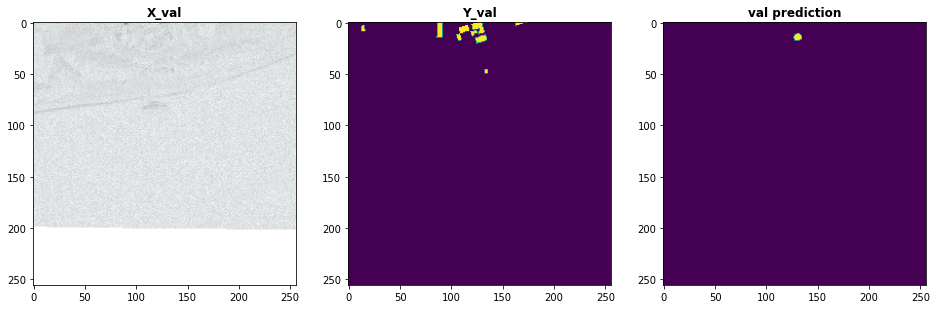

index: 52
test preds  set


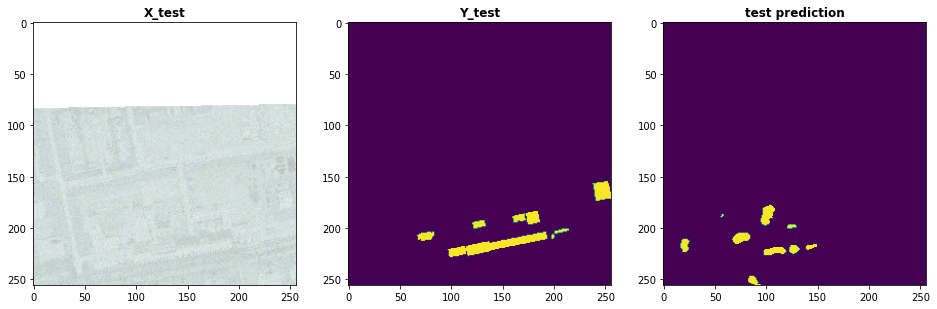

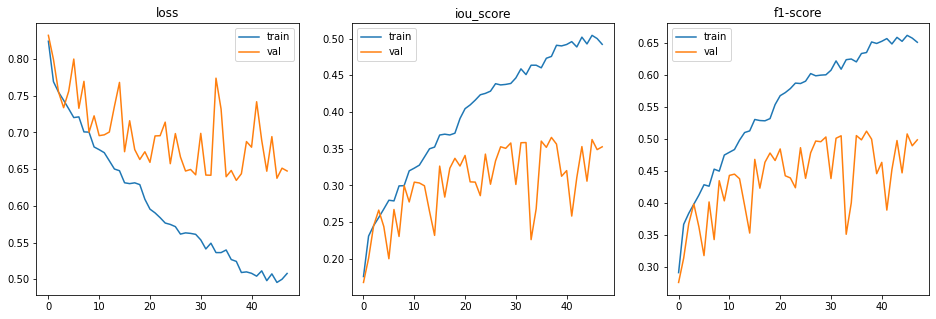

In [ ]:
''' plot predictions to visualize ''' 
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
if results != None:
  plot_history(results.history)

### ID 74

In [ ]:
''' set the train/test ''' 
IMG_TYPE, IMG_WIDTH, IMG_HEIGHT, IMG_ROTATED, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE = gen_input_image_details('SAR-Intensity', False)       # CHANGE HERE
PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK, PATH_SAMPLE, PATH_SAVED_MODELS = gen_paths(IMG_TYPE, IMG_ROTATED)
if IMG_ROTATED:
  X_train, Y_train, X_test, Y_test = X_train_rotate, Y_train_rotate, X_test_rotate, Y_test_rotate
else:
  X_train, Y_train, X_test, Y_test = X_train_no_rotate, Y_train_no_rotate, X_test_no_rotate, Y_test_no_rotate

gen_input_image_details()
IMG_TYPE: SAR-Intensity, IMG_HEIGHT: 256, IMG_WIDTH: 256, IMG_ROTATED: False, IMG_CHANNELS: 4, IMG_DTYPE_SRC: <class 'numpy.float32'>, IMG_DTYPE: <class 'numpy.uint8'>

gen_paths()
PATH_SRC: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam, 
PATH_SRC_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/SAR-Intensity, 
PATH_SRC_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/_mask, 
PATH_DATA: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256, 
PATH_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/image, 
PATH_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/mask, 
PATH_SAMPLE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/sample, 
P

In [ ]:
''' set the model parameters, train model '''
MODEL_OPTIMIZER, MODEL_LOSS, MODEL_METRICS, MODEL_VAL_SPLIT, MODEL_VAL_OFFSET, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_ID, MODEL_NAME, model = gen_model(
    BinaryFocalLoss(alpha=0.5, gamma=1), 4, 100, 'segmentation-models Unet', 'efficientnetb0', 'BinaryFocalLoss(alpha=0.5, gamma=1)', IMG_CHANNELS, MODEL_ID=74, MODEL_COMMENTS='batch size test, early stopping patience 10')          # CHANGE HERE

results, model = gen_model_results(PATH_SAVED_MODELS, MODEL_NAME, X_train, Y_train, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_VAL_SPLIT, 
                                   load_weights_filename='', load_weights_epochs=0, save_model=True)                                            # CHANGE HERE

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


No weights loaded. Training new model
Train on 720 samples, validate on 80 samples
Epoch 1/100
720/720 [==============================] - 58s 80ms/step - loss: 0.8222 - iou_score: 0.1778 - f1-score: 0.2936 - val_loss: 0.9743 - val_iou_score: 0.0257 - val_f1-score: 0.0488
Epoch 2/100
720/720 [==============================] - 35s 49ms/step - loss: 0.7700 - iou_score: 0.2300 - f1-score: 0.3654 - val_loss: 0.9829 - val_iou_score: 0.0171 - val_f1-score: 0.0322
Epoch 3/100
720/720 [==============================] - 35s 49ms/step - loss: 0.7528 - iou_score: 0.2472 - f1-score: 0.3868 - val_loss: 0.8863 - val_iou_score: 0.1137 - val_f1-score: 0.1818
Epoch 4/100
720/720 [==============================] - 35s 49ms/step - loss: 0.7406 - iou_score: 0.2594 - f1-score: 0.4012 - val_loss: 0.7866 - val_iou_score: 0.2134 - val_f1-score: 0.3190
Epoch 5/100
720/720 [==============================] - 35s 49ms/step - loss: 0.7303 - iou_score: 0.2697 - f1-score: 0.4141 - val_loss: 0.7534 - val_iou_score: 0.

In [ ]:
''' predict using model '''
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_NAME, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_BATCH_SIZE, MODEL_EPOCHS)

80/80 [==============================] - 1s 8ms/step
train set evaluation
720/720 [==============================] - 5s 8ms/step
loss :  0.4253638095325894
iou_score :  0.5746299028396606
f1-score :  0.7290950417518616

validation set evaluation
80/80 [==============================] - 1s 9ms/step
loss :  0.8692740678787232
iou_score :  0.14001744985580444
f1-score :  0.24391376972198486

test set evaluation
80/80 [==============================] - 1s 8ms/step
loss :  0.5731884002685547
iou_score :  0.4355844259262085
f1-score :  0.6061946749687195
saved model metrics


index: 577
train preds  set


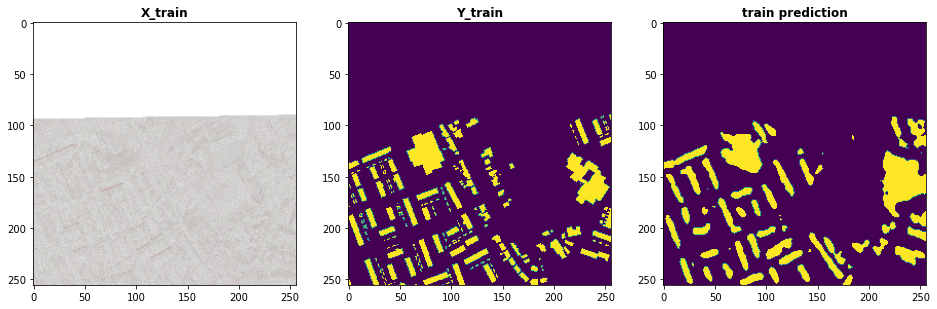

index: 1
val preds  set


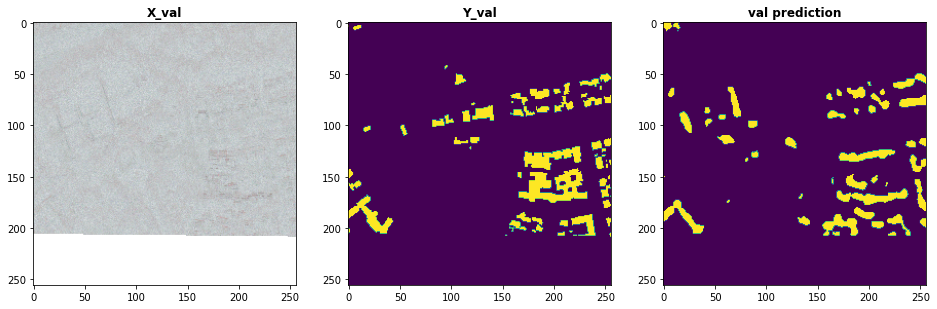

index: 6
test preds  set


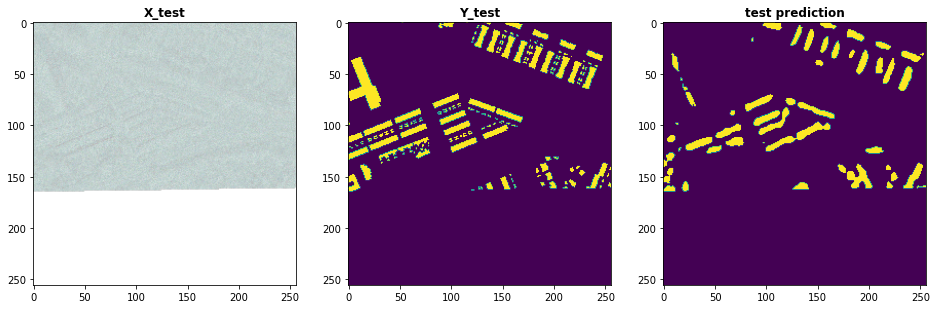

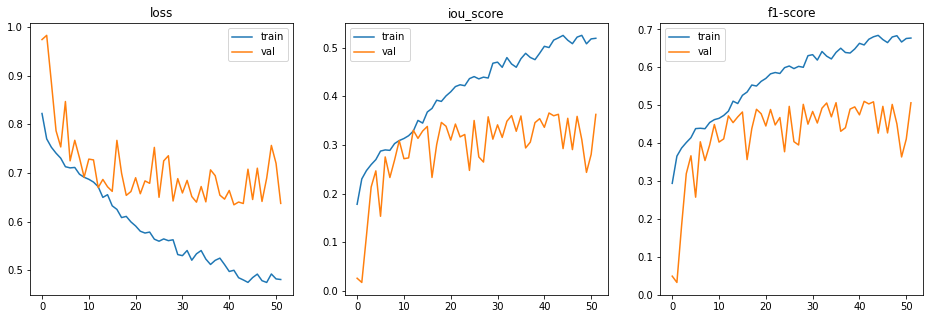

In [ ]:
''' plot predictions to visualize ''' 
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
if results != None:
  plot_history(results.history)

### ID 75

In [ ]:
''' set the train/test ''' 
IMG_TYPE, IMG_WIDTH, IMG_HEIGHT, IMG_ROTATED, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE = gen_input_image_details('SAR-Intensity', False)       # CHANGE HERE
PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK, PATH_SAMPLE, PATH_SAVED_MODELS = gen_paths(IMG_TYPE, IMG_ROTATED)
if IMG_ROTATED:
  X_train, Y_train, X_test, Y_test = X_train_rotate, Y_train_rotate, X_test_rotate, Y_test_rotate
else:
  X_train, Y_train, X_test, Y_test = X_train_no_rotate, Y_train_no_rotate, X_test_no_rotate, Y_test_no_rotate

gen_input_image_details()
IMG_TYPE: SAR-Intensity, IMG_HEIGHT: 256, IMG_WIDTH: 256, IMG_ROTATED: False, IMG_CHANNELS: 4, IMG_DTYPE_SRC: <class 'numpy.float32'>, IMG_DTYPE: <class 'numpy.uint8'>

gen_paths()
PATH_SRC: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam, 
PATH_SRC_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/SAR-Intensity, 
PATH_SRC_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/_mask, 
PATH_DATA: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256, 
PATH_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/image, 
PATH_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/mask, 
PATH_SAMPLE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/sample, 
P

In [ ]:
''' set the model parameters, train model '''
MODEL_OPTIMIZER, MODEL_LOSS, MODEL_METRICS, MODEL_VAL_SPLIT, MODEL_VAL_OFFSET, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_ID, MODEL_NAME, model = gen_model(
    BinaryFocalLoss(alpha=0.5, gamma=1), 4, 100, 'segmentation-models Unet', 'efficientnetb0', 'BinaryFocalLoss(alpha=0.5, gamma=1)', IMG_CHANNELS, MODEL_ID=75, MODEL_COMMENTS='batch size test, early stopping patience 10')          # CHANGE HERE

results, model = gen_model_results(PATH_SAVED_MODELS, MODEL_NAME, X_train, Y_train, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_VAL_SPLIT, 
                                   load_weights_filename='', load_weights_epochs=0, save_model=True)                                            # CHANGE HERE

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


No weights loaded. Training new model
Train on 720 samples, validate on 80 samples
Epoch 1/100
720/720 [==============================] - 58s 80ms/step - loss: 0.8372 - iou_score: 0.1628 - f1-score: 0.2723 - val_loss: 0.8934 - val_iou_score: 0.1066 - val_f1-score: 0.1862
Epoch 2/100
720/720 [==============================] - 35s 49ms/step - loss: 0.7799 - iou_score: 0.2201 - f1-score: 0.3496 - val_loss: 0.7854 - val_iou_score: 0.2146 - val_f1-score: 0.3300
Epoch 3/100
720/720 [==============================] - 35s 49ms/step - loss: 0.7600 - iou_score: 0.2400 - f1-score: 0.3764 - val_loss: 0.8027 - val_iou_score: 0.1973 - val_f1-score: 0.3050
Epoch 4/100
720/720 [==============================] - 35s 49ms/step - loss: 0.7508 - iou_score: 0.2492 - f1-score: 0.3887 - val_loss: 0.7562 - val_iou_score: 0.2438 - val_f1-score: 0.3664
Epoch 5/100
720/720 [==============================] - 35s 49ms/step - loss: 0.7396 - iou_score: 0.2604 - f1-score: 0.4027 - val_loss: 0.8759 - val_iou_score: 0.

In [ ]:
''' predict using model '''
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_NAME, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_BATCH_SIZE, MODEL_EPOCHS)

80/80 [==============================] - 1s 8ms/step
train set evaluation
720/720 [==============================] - 5s 8ms/step
loss :  0.5859809822506374
iou_score :  0.41454318165779114
f1-score :  0.5855038166046143

validation set evaluation
80/80 [==============================] - 1s 8ms/step
loss :  0.7293764829635621
iou_score :  0.28906556963920593
f1-score :  0.443467378616333

test set evaluation
80/80 [==============================] - 1s 8ms/step
loss :  0.638662052154541
iou_score :  0.3646564185619354
f1-score :  0.5338426232337952
saved model metrics


index: 334
train preds  set


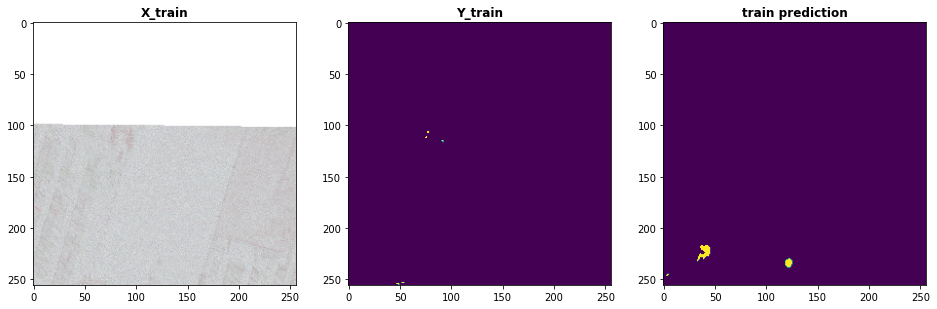

index: 54
val preds  set


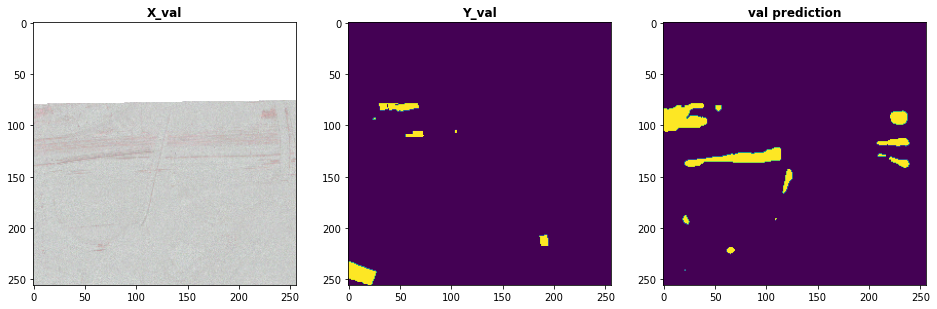

index: 38
test preds  set


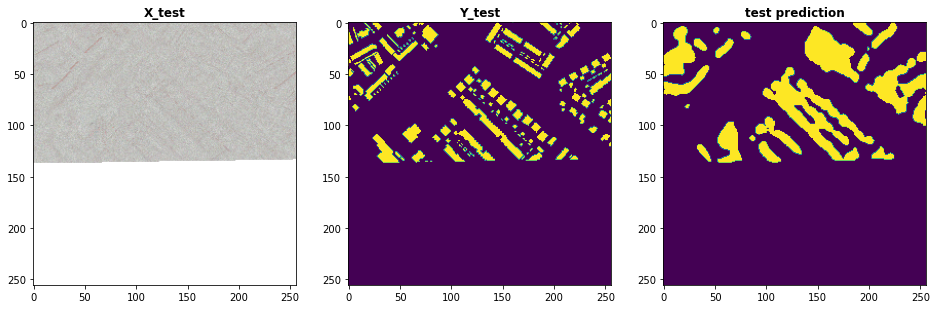

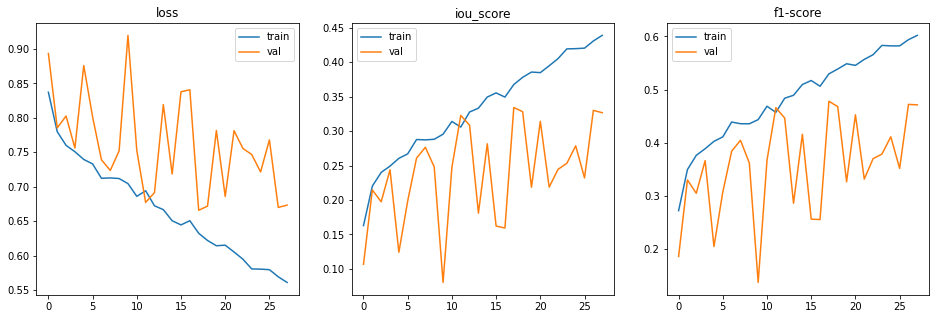

In [ ]:
''' plot predictions to visualize ''' 
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
if results != None:
  plot_history(results.history)

### ID 76

In [ ]:
''' set the train/test ''' 
IMG_TYPE, IMG_WIDTH, IMG_HEIGHT, IMG_ROTATED, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE = gen_input_image_details('SAR-Intensity', False)       # CHANGE HERE
PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK, PATH_SAMPLE, PATH_SAVED_MODELS = gen_paths(IMG_TYPE, IMG_ROTATED)
if IMG_ROTATED:
  X_train, Y_train, X_test, Y_test = X_train_rotate, Y_train_rotate, X_test_rotate, Y_test_rotate
else:
  X_train, Y_train, X_test, Y_test = X_train_no_rotate, Y_train_no_rotate, X_test_no_rotate, Y_test_no_rotate

gen_input_image_details()
IMG_TYPE: SAR-Intensity, IMG_HEIGHT: 256, IMG_WIDTH: 256, IMG_ROTATED: False, IMG_CHANNELS: 4, IMG_DTYPE_SRC: <class 'numpy.float32'>, IMG_DTYPE: <class 'numpy.uint8'>

gen_paths()
PATH_SRC: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam, 
PATH_SRC_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/SAR-Intensity, 
PATH_SRC_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/_mask, 
PATH_DATA: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256, 
PATH_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/image, 
PATH_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/mask, 
PATH_SAMPLE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/sample, 
P

In [ ]:
''' set the model parameters, train model '''
MODEL_OPTIMIZER, MODEL_LOSS, MODEL_METRICS, MODEL_VAL_SPLIT, MODEL_VAL_OFFSET, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_ID, MODEL_NAME, model = gen_model(
    BinaryFocalLoss(alpha=0.5, gamma=1), 4, 100, 'segmentation-models Unet', 'efficientnetb0', 'BinaryFocalLoss(alpha=0.5, gamma=1)', IMG_CHANNELS, MODEL_ID=76, MODEL_COMMENTS='batch size test, early stopping patience 10')          # CHANGE HERE

results, model = gen_model_results(PATH_SAVED_MODELS, MODEL_NAME, X_train, Y_train, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_VAL_SPLIT, 
                                   load_weights_filename='', load_weights_epochs=0, save_model=True)                                            # CHANGE HERE

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


No weights loaded. Training new model
Train on 720 samples, validate on 80 samples
Epoch 1/100
720/720 [==============================] - 58s 81ms/step - loss: 0.8134 - iou_score: 0.1866 - f1-score: 0.3041 - val_loss: 0.9219 - val_iou_score: 0.0781 - val_f1-score: 0.1406
Epoch 2/100
720/720 [==============================] - 35s 49ms/step - loss: 0.7697 - iou_score: 0.2303 - f1-score: 0.3649 - val_loss: 0.8803 - val_iou_score: 0.1197 - val_f1-score: 0.2060
Epoch 3/100
720/720 [==============================] - 35s 49ms/step - loss: 0.7540 - iou_score: 0.2460 - f1-score: 0.3841 - val_loss: 0.7470 - val_iou_score: 0.2530 - val_f1-score: 0.3830
Epoch 4/100
720/720 [==============================] - 35s 49ms/step - loss: 0.7457 - iou_score: 0.2543 - f1-score: 0.3936 - val_loss: 0.7487 - val_iou_score: 0.2513 - val_f1-score: 0.3794
Epoch 5/100
720/720 [==============================] - 35s 49ms/step - loss: 0.7204 - iou_score: 0.2796 - f1-score: 0.4272 - val_loss: 0.8097 - val_iou_score: 0.

In [ ]:
''' predict using model '''
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_NAME, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_BATCH_SIZE, MODEL_EPOCHS)

80/80 [==============================] - 1s 8ms/step
train set evaluation
720/720 [==============================] - 5s 8ms/step
loss :  0.5245616594950359
iou_score :  0.475834459066391
f1-score :  0.6441761255264282

validation set evaluation
80/80 [==============================] - 1s 8ms/step
loss :  0.7781922340393066
iou_score :  0.23338700830936432
f1-score :  0.37634459137916565

test set evaluation
80/80 [==============================] - 1s 8ms/step
loss :  0.6022109985351562
iou_score :  0.4046113193035126
f1-score :  0.575396716594696
saved model metrics


index: 565
train preds  set


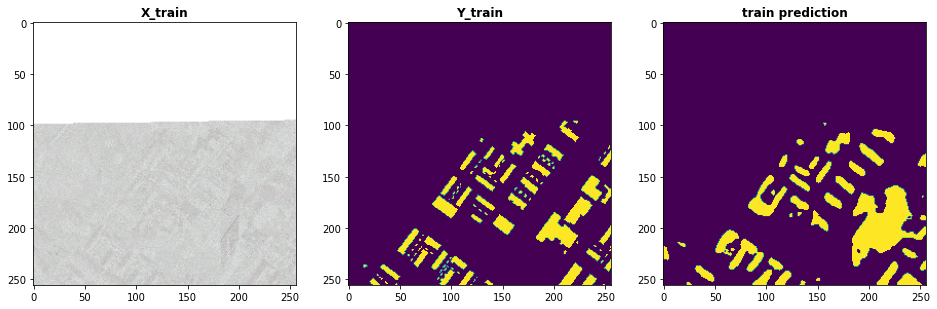

index: 58
val preds  set


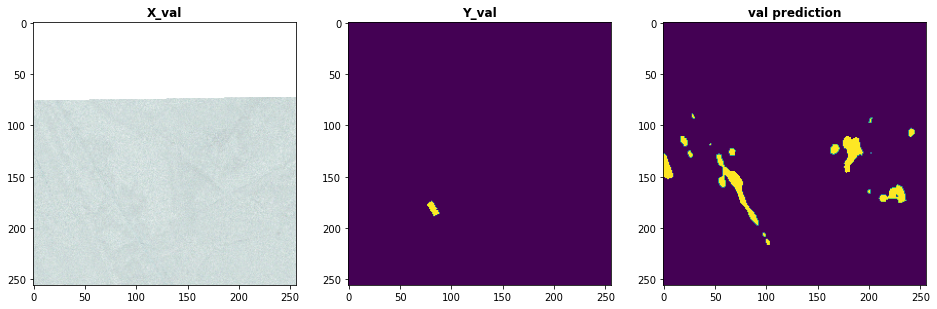

index: 19
test preds  set


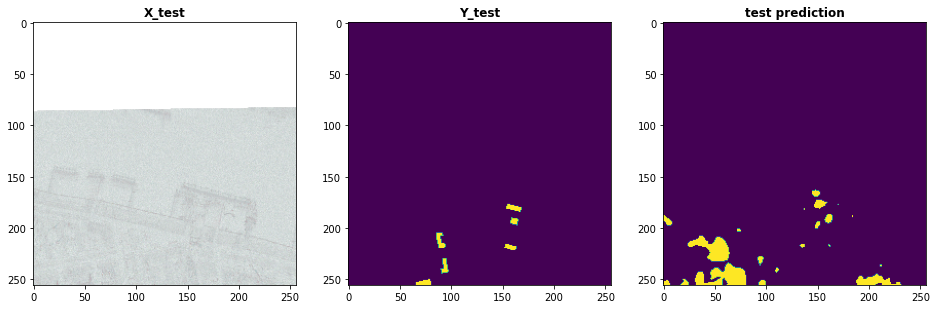

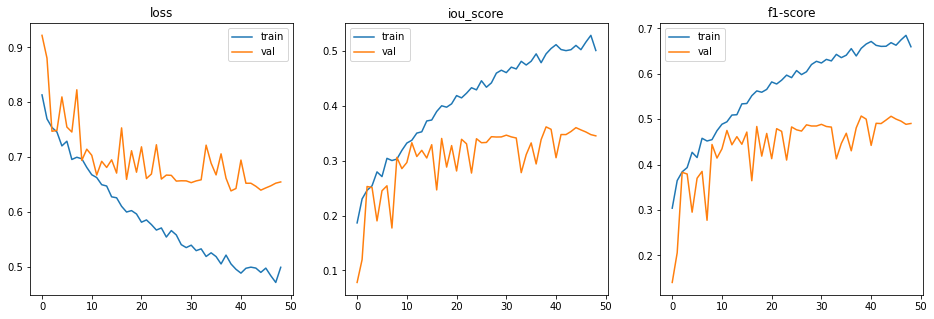

In [ ]:
''' plot predictions to visualize ''' 
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
if results != None:
  plot_history(results.history)

### ID 77

In [ ]:
''' set the train/test ''' 
IMG_TYPE, IMG_WIDTH, IMG_HEIGHT, IMG_ROTATED, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE = gen_input_image_details('SAR-Intensity', False)       # CHANGE HERE
PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK, PATH_SAMPLE, PATH_SAVED_MODELS = gen_paths(IMG_TYPE, IMG_ROTATED)
if IMG_ROTATED:
  X_train, Y_train, X_test, Y_test = X_train_rotate, Y_train_rotate, X_test_rotate, Y_test_rotate
else:
  X_train, Y_train, X_test, Y_test = X_train_no_rotate, Y_train_no_rotate, X_test_no_rotate, Y_test_no_rotate

gen_input_image_details()
IMG_TYPE: SAR-Intensity, IMG_HEIGHT: 256, IMG_WIDTH: 256, IMG_ROTATED: False, IMG_CHANNELS: 4, IMG_DTYPE_SRC: <class 'numpy.float32'>, IMG_DTYPE: <class 'numpy.uint8'>

gen_paths()
PATH_SRC: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam, 
PATH_SRC_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/SAR-Intensity, 
PATH_SRC_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/_mask, 
PATH_DATA: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256, 
PATH_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/image, 
PATH_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/mask, 
PATH_SAMPLE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/sample, 
P

In [ ]:
''' set the model parameters, train model '''
MODEL_OPTIMIZER, MODEL_LOSS, MODEL_METRICS, MODEL_VAL_SPLIT, MODEL_VAL_OFFSET, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_ID, MODEL_NAME, model = gen_model(
    BinaryFocalLoss(alpha=0.5, gamma=1), 4, 100, 'segmentation-models Unet', 'efficientnetb0', 'BinaryFocalLoss(alpha=0.5, gamma=1)', IMG_CHANNELS, MODEL_ID=77, MODEL_COMMENTS='batch size test, early stopping patience 10')          # CHANGE HERE

results, model = gen_model_results(PATH_SAVED_MODELS, MODEL_NAME, X_train, Y_train, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_VAL_SPLIT, 
                                   load_weights_filename='', load_weights_epochs=0, save_model=True)                                            # CHANGE HERE

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


No weights loaded. Training new model
Train on 720 samples, validate on 80 samples
Epoch 1/100
720/720 [==============================] - 57s 80ms/step - loss: 0.8296 - iou_score: 0.1704 - f1-score: 0.2824 - val_loss: 0.8327 - val_iou_score: 0.1673 - val_f1-score: 0.2752
Epoch 2/100
720/720 [==============================] - 35s 49ms/step - loss: 0.7726 - iou_score: 0.2274 - f1-score: 0.3607 - val_loss: 0.9829 - val_iou_score: 0.0171 - val_f1-score: 0.0316
Epoch 3/100
720/720 [==============================] - 35s 48ms/step - loss: 0.7482 - iou_score: 0.2518 - f1-score: 0.3925 - val_loss: 0.7588 - val_iou_score: 0.2412 - val_f1-score: 0.3657
Epoch 4/100
720/720 [==============================] - 35s 49ms/step - loss: 0.7324 - iou_score: 0.2676 - f1-score: 0.4124 - val_loss: 0.7380 - val_iou_score: 0.2620 - val_f1-score: 0.3903
Epoch 5/100
720/720 [==============================] - 35s 48ms/step - loss: 0.7326 - iou_score: 0.2674 - f1-score: 0.4107 - val_loss: 0.7670 - val_iou_score: 0.

In [ ]:
''' predict using model '''
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_NAME, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_BATCH_SIZE, MODEL_EPOCHS)

80/80 [==============================] - 1s 8ms/step
train set evaluation
720/720 [==============================] - 5s 8ms/step
loss :  0.537527683046129
iou_score :  0.46198877692222595
f1-score :  0.6300936341285706

validation set evaluation
80/80 [==============================] - 1s 9ms/step
loss :  0.9069959998130799
iou_score :  0.09985029697418213
f1-score :  0.18054978549480438

test set evaluation
80/80 [==============================] - 1s 8ms/step
loss :  0.6439194202423095
iou_score :  0.36442527174949646
f1-score :  0.533481776714325
saved model metrics


index: 407
train preds  set


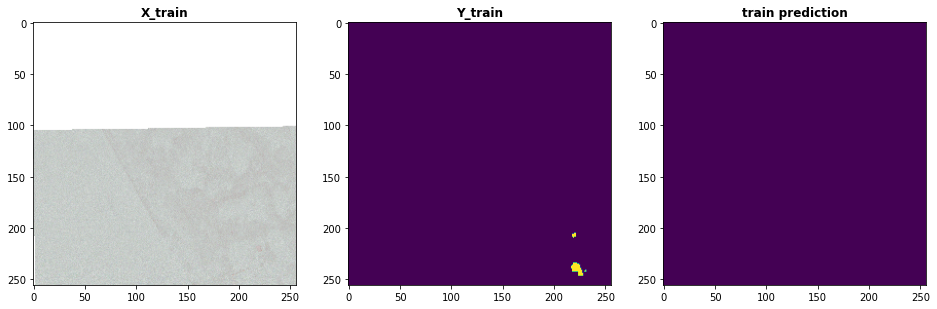

index: 42
val preds  set


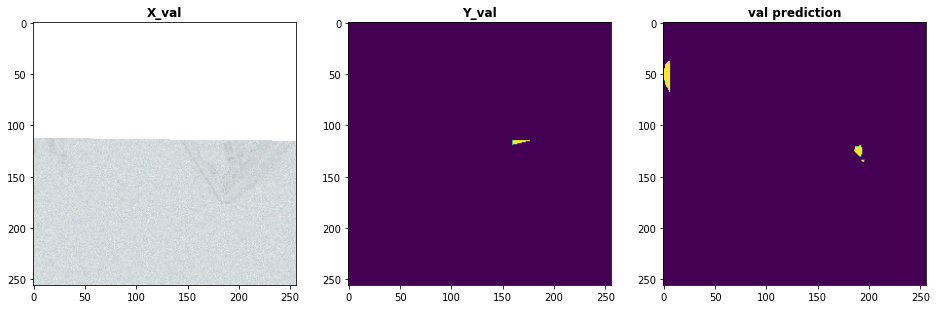

index: 66
test preds  set


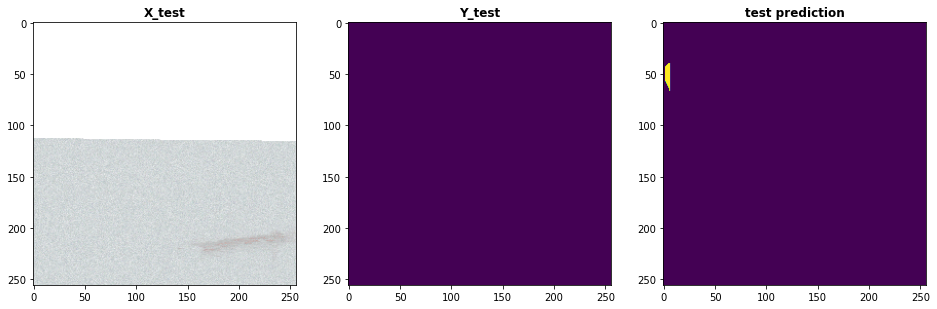

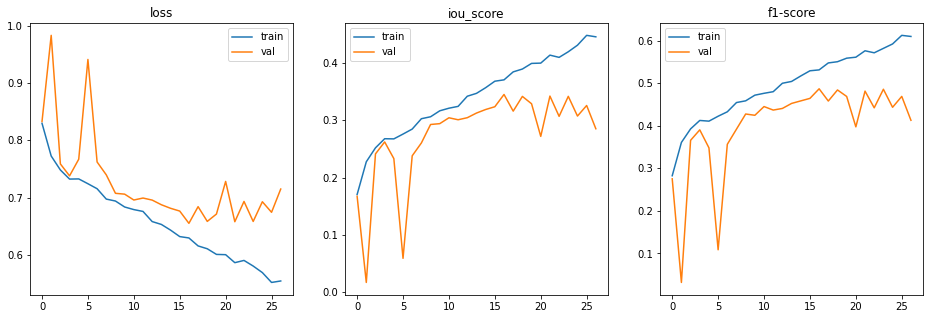

In [ ]:
''' plot predictions to visualize ''' 
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
if results != None:
  plot_history(results.history)

### ID 78

In [ ]:
''' set the train/test ''' 
IMG_TYPE, IMG_WIDTH, IMG_HEIGHT, IMG_ROTATED, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE = gen_input_image_details('SAR-Intensity', False)       # CHANGE HERE
PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK, PATH_SAMPLE, PATH_SAVED_MODELS = gen_paths(IMG_TYPE, IMG_ROTATED)
if IMG_ROTATED:
  X_train, Y_train, X_test, Y_test = X_train_rotate, Y_train_rotate, X_test_rotate, Y_test_rotate
else:
  X_train, Y_train, X_test, Y_test = X_train_no_rotate, Y_train_no_rotate, X_test_no_rotate, Y_test_no_rotate

gen_input_image_details()
IMG_TYPE: SAR-Intensity, IMG_HEIGHT: 256, IMG_WIDTH: 256, IMG_ROTATED: False, IMG_CHANNELS: 4, IMG_DTYPE_SRC: <class 'numpy.float32'>, IMG_DTYPE: <class 'numpy.uint8'>

gen_paths()
PATH_SRC: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam, 
PATH_SRC_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/SAR-Intensity, 
PATH_SRC_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/_mask, 
PATH_DATA: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256, 
PATH_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/image, 
PATH_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/mask, 
PATH_SAMPLE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/sample, 
P

In [ ]:
''' set the model parameters, train model '''
MODEL_OPTIMIZER, MODEL_LOSS, MODEL_METRICS, MODEL_VAL_SPLIT, MODEL_VAL_OFFSET, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_ID, MODEL_NAME, model = gen_model(
    BinaryFocalLoss(alpha=0.5, gamma=1), 4, 100, 'segmentation-models Unet', 'efficientnetb0', 'BinaryFocalLoss(alpha=0.5, gamma=1)', IMG_CHANNELS, MODEL_ID=78, MODEL_COMMENTS='batch size test, early stopping patience 10')          # CHANGE HERE

results, model = gen_model_results(PATH_SAVED_MODELS, MODEL_NAME, X_train, Y_train, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_VAL_SPLIT, 
                                   load_weights_filename='', load_weights_epochs=0, save_model=True)                                            # CHANGE HERE

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


No weights loaded. Training new model
Train on 720 samples, validate on 80 samples
Epoch 1/100
720/720 [==============================] - 59s 82ms/step - loss: 0.8337 - iou_score: 0.1663 - f1-score: 0.2769 - val_loss: 0.8357 - val_iou_score: 0.1643 - val_f1-score: 0.2714
Epoch 2/100
720/720 [==============================] - 35s 49ms/step - loss: 0.7794 - iou_score: 0.2206 - f1-score: 0.3521 - val_loss: 0.8303 - val_iou_score: 0.1697 - val_f1-score: 0.2743
Epoch 3/100
720/720 [==============================] - 35s 48ms/step - loss: 0.7579 - iou_score: 0.2421 - f1-score: 0.3808 - val_loss: 0.7591 - val_iou_score: 0.2409 - val_f1-score: 0.3620
Epoch 4/100
720/720 [==============================] - 35s 49ms/step - loss: 0.7537 - iou_score: 0.2463 - f1-score: 0.3855 - val_loss: 0.7929 - val_iou_score: 0.2071 - val_f1-score: 0.3122
Epoch 5/100
720/720 [==============================] - 35s 49ms/step - loss: 0.7357 - iou_score: 0.2643 - f1-score: 0.4082 - val_loss: 0.7914 - val_iou_score: 0.

In [ ]:
''' predict using model '''
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_NAME, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_BATCH_SIZE, MODEL_EPOCHS)

80/80 [==============================] - 1s 8ms/step
train set evaluation
720/720 [==============================] - 5s 8ms/step
loss :  0.3854664338959588
iou_score :  0.6142941117286682
f1-score :  0.7602952122688293

validation set evaluation
80/80 [==============================] - 1s 8ms/step
loss :  0.8762742519378662
iou_score :  0.1314232349395752
f1-score :  0.23094511032104492

test set evaluation
80/80 [==============================] - 1s 8ms/step
loss :  0.5815864324569702
iou_score :  0.42930302023887634
f1-score :  0.5996564030647278
saved model metrics


index: 404
train preds  set


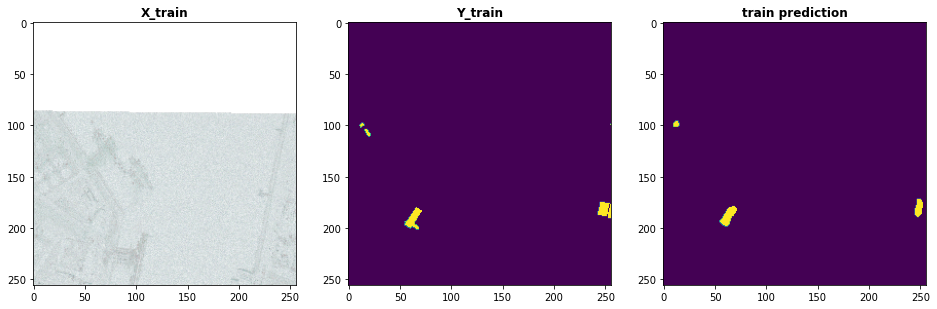

index: 70
val preds  set


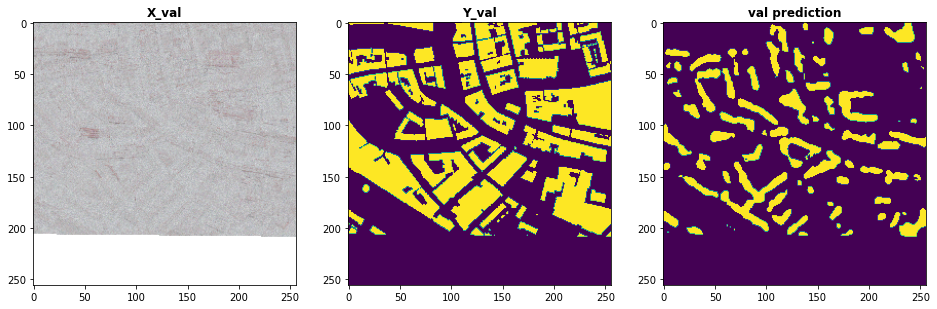

index: 47
test preds  set


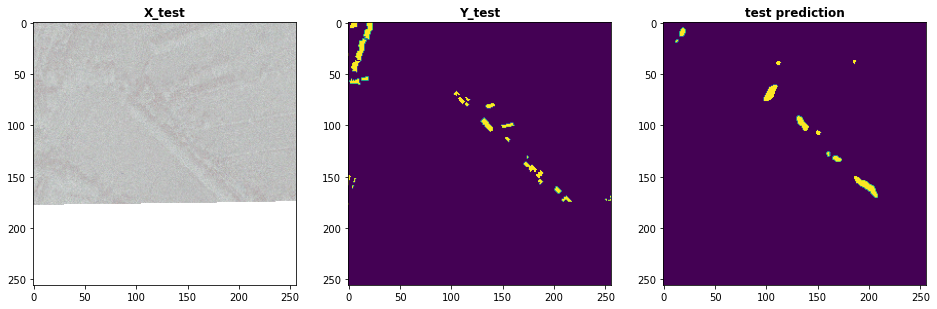

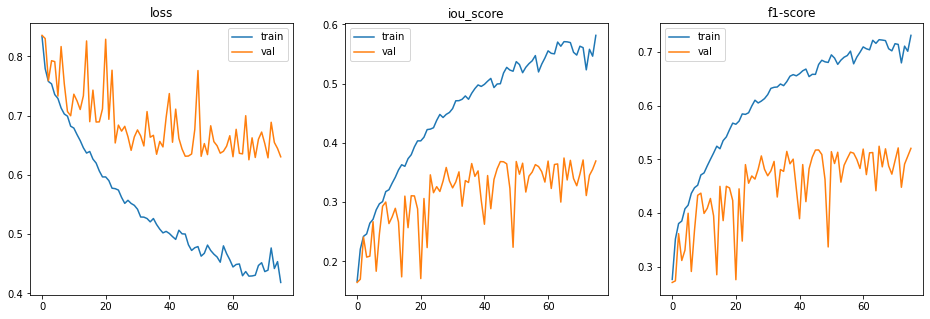

In [ ]:
''' plot predictions to visualize ''' 
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
if results != None:
  plot_history(results.history)

### ID 79

In [ ]:
''' set the train/test ''' 
IMG_TYPE, IMG_WIDTH, IMG_HEIGHT, IMG_ROTATED, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE = gen_input_image_details('SAR-Intensity', False)       # CHANGE HERE
PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK, PATH_SAMPLE, PATH_SAVED_MODELS = gen_paths(IMG_TYPE, IMG_ROTATED)
if IMG_ROTATED:
  X_train, Y_train, X_test, Y_test = X_train_rotate, Y_train_rotate, X_test_rotate, Y_test_rotate
else:
  X_train, Y_train, X_test, Y_test = X_train_no_rotate, Y_train_no_rotate, X_test_no_rotate, Y_test_no_rotate

gen_input_image_details()
IMG_TYPE: SAR-Intensity, IMG_HEIGHT: 256, IMG_WIDTH: 256, IMG_ROTATED: False, IMG_CHANNELS: 4, IMG_DTYPE_SRC: <class 'numpy.float32'>, IMG_DTYPE: <class 'numpy.uint8'>

gen_paths()
PATH_SRC: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam, 
PATH_SRC_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/SAR-Intensity, 
PATH_SRC_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/_mask, 
PATH_DATA: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256, 
PATH_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/image, 
PATH_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/mask, 
PATH_SAMPLE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/sample, 
P

In [ ]:
''' set the model parameters, train model '''
MODEL_OPTIMIZER, MODEL_LOSS, MODEL_METRICS, MODEL_VAL_SPLIT, MODEL_VAL_OFFSET, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_ID, MODEL_NAME, model = gen_model(
    BinaryFocalLoss(alpha=0.5, gamma=1), 4, 100, 'segmentation-models Unet', 'efficientnetb0', 'BinaryFocalLoss(alpha=0.5, gamma=1)', IMG_CHANNELS, MODEL_ID=79, MODEL_COMMENTS='batch size test, early stopping patience 10')          # CHANGE HERE

results, model = gen_model_results(PATH_SAVED_MODELS, MODEL_NAME, X_train, Y_train, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_VAL_SPLIT, 
                                   load_weights_filename='', load_weights_epochs=0, save_model=True)                                            # CHANGE HERE

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


No weights loaded. Training new model
Train on 720 samples, validate on 80 samples
Epoch 1/100
720/720 [==============================] - 58s 80ms/step - loss: 0.8192 - iou_score: 0.1808 - f1-score: 0.2976 - val_loss: 0.9839 - val_iou_score: 0.0161 - val_f1-score: 0.0314
Epoch 2/100
720/720 [==============================] - 35s 49ms/step - loss: 0.7757 - iou_score: 0.2243 - f1-score: 0.3566 - val_loss: 0.8896 - val_iou_score: 0.1104 - val_f1-score: 0.1898
Epoch 3/100
720/720 [==============================] - 35s 48ms/step - loss: 0.7603 - iou_score: 0.2397 - f1-score: 0.3766 - val_loss: 0.9577 - val_iou_score: 0.0423 - val_f1-score: 0.0770
Epoch 4/100
720/720 [==============================] - 35s 48ms/step - loss: 0.7468 - iou_score: 0.2532 - f1-score: 0.3939 - val_loss: 0.8238 - val_iou_score: 0.1762 - val_f1-score: 0.2746
Epoch 5/100
720/720 [==============================] - 35s 49ms/step - loss: 0.7316 - iou_score: 0.2684 - f1-score: 0.4117 - val_loss: 0.7530 - val_iou_score: 0.

In [ ]:
''' predict using model '''
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_NAME, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_BATCH_SIZE, MODEL_EPOCHS)

80/80 [==============================] - 1s 8ms/step
train set evaluation
720/720 [==============================] - 5s 8ms/step
loss :  0.3652737842665778
iou_score :  0.6343609094619751
f1-score :  0.7754889726638794

validation set evaluation
80/80 [==============================] - 1s 9ms/step
loss :  0.8893554449081421
iou_score :  0.11991754919290543
f1-score :  0.21247553825378418

test set evaluation
80/80 [==============================] - 1s 8ms/step
loss :  0.6052559852600098
iou_score :  0.4061698615550995
f1-score :  0.5764995813369751
saved model metrics


index: 64
train preds  set


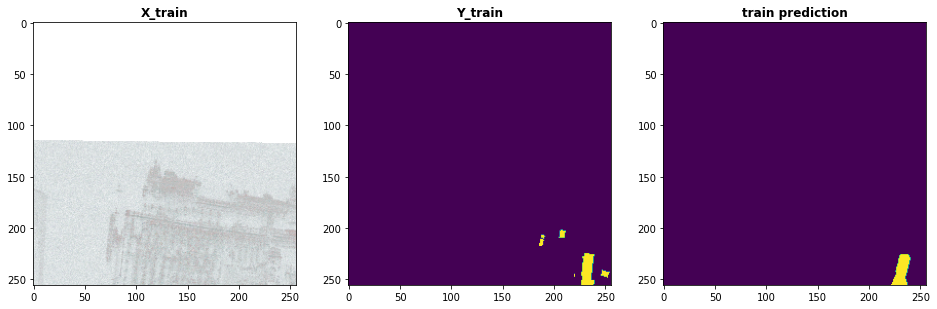

index: 9
val preds  set


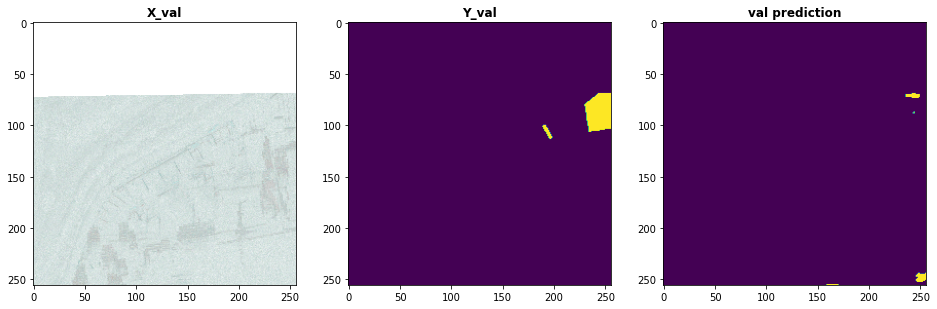

index: 26
test preds  set


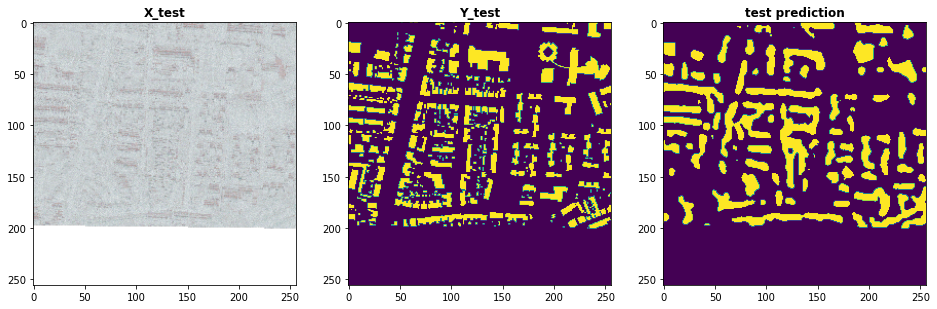

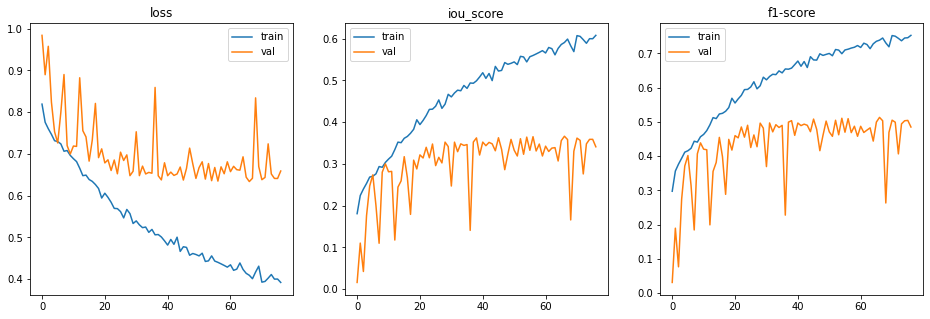

In [ ]:
''' plot predictions to visualize ''' 
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
if results != None:
  plot_history(results.history)

### ID 80

In [ ]:
''' set the train/test ''' 
IMG_TYPE, IMG_WIDTH, IMG_HEIGHT, IMG_ROTATED, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE = gen_input_image_details('SAR-Intensity', False)       # CHANGE HERE
PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK, PATH_SAMPLE, PATH_SAVED_MODELS = gen_paths(IMG_TYPE, IMG_ROTATED)
if IMG_ROTATED:
  X_train, Y_train, X_test, Y_test = X_train_rotate, Y_train_rotate, X_test_rotate, Y_test_rotate
else:
  X_train, Y_train, X_test, Y_test = X_train_no_rotate, Y_train_no_rotate, X_test_no_rotate, Y_test_no_rotate

gen_input_image_details()
IMG_TYPE: SAR-Intensity, IMG_HEIGHT: 256, IMG_WIDTH: 256, IMG_ROTATED: False, IMG_CHANNELS: 4, IMG_DTYPE_SRC: <class 'numpy.float32'>, IMG_DTYPE: <class 'numpy.uint8'>

gen_paths()
PATH_SRC: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam, 
PATH_SRC_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/SAR-Intensity, 
PATH_SRC_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam/_mask, 
PATH_DATA: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256, 
PATH_IMAGE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/image, 
PATH_MASK: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/mask, 
PATH_SAMPLE: /content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/SAR-Intensity_256x256/sample, 
P

In [ ]:
''' set the model parameters, train model '''
MODEL_OPTIMIZER, MODEL_LOSS, MODEL_METRICS, MODEL_VAL_SPLIT, MODEL_VAL_OFFSET, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_ID, MODEL_NAME, model = gen_model(
    BinaryFocalLoss(alpha=0.5, gamma=1), 4, 100, 'segmentation-models Unet', 'efficientnetb0', 'BinaryFocalLoss(alpha=0.5, gamma=1)', IMG_CHANNELS, MODEL_ID=80, MODEL_COMMENTS='batch size test, early stopping patience 10')          # CHANGE HERE

results, model = gen_model_results(PATH_SAVED_MODELS, MODEL_NAME, X_train, Y_train, MODEL_BATCH_SIZE, MODEL_EPOCHS, MODEL_VAL_SPLIT, 
                                   load_weights_filename='', load_weights_epochs=0, save_model=True)                                            # CHANGE HERE

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


No weights loaded. Training new model
Train on 720 samples, validate on 80 samples
Epoch 1/100
720/720 [==============================] - 57s 79ms/step - loss: 0.8343 - iou_score: 0.1657 - f1-score: 0.2755 - val_loss: 0.8428 - val_iou_score: 0.1572 - val_f1-score: 0.2553
Epoch 2/100
720/720 [==============================] - 35s 49ms/step - loss: 0.7710 - iou_score: 0.2290 - f1-score: 0.3638 - val_loss: 0.8980 - val_iou_score: 0.1020 - val_f1-score: 0.1714
Epoch 3/100
720/720 [==============================] - 35s 49ms/step - loss: 0.7626 - iou_score: 0.2374 - f1-score: 0.3723 - val_loss: 0.7639 - val_iou_score: 0.2361 - val_f1-score: 0.3514
Epoch 4/100
720/720 [==============================] - 35s 49ms/step - loss: 0.7482 - iou_score: 0.2518 - f1-score: 0.3927 - val_loss: 0.8137 - val_iou_score: 0.1863 - val_f1-score: 0.2941
Epoch 5/100
720/720 [==============================] - 35s 49ms/step - loss: 0.7376 - iou_score: 0.2624 - f1-score: 0.4056 - val_loss: 0.7920 - val_iou_score: 0.

In [ ]:
''' predict using model '''
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, IMG_ROTATED, MODEL_NAME, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, MODEL_COMMENTS, MODEL_BATCH_SIZE, MODEL_EPOCHS)

In [ ]:
''' plot predictions to visualize ''' 
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
if results != None:
  plot_history(results.history)

## Findings

Smaller batch sizes are better for helping the model learn faster and better

Patience=10 is a sufficient number to stop the model once it has learnt as much as it can